# Introduction

loading the given data set

In [ ]:

output_path <- "/kaggle/input/assignment-df/output_40422084.csv"
print(output_path)
df <- read.csv(output_path)
head(df)




[1] "/kaggle/input/assignment-df/output_40422084.csv"


,ID_non_uniq,date_event,last_year_all_product_codes_num_uniq,last_year_all_product_codes_most_freq,last_year_brand_name_num_uniq,last_year_brand_name_most_freq,last_year_classification0_num_uniq,last_year_classification1_num_uniq,last_year_classification2_num_uniq,last_year_company_name_num_uniq,⋯,type_of_report.1,reporter_job_code,source_type,product.manufacturer_name,product.product_operator,product.manufacturer_city,product.manufacturer_state,product.manufacturer_country,product.field_description,product.product_report_product_code
,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<chr>,<chr>
1,p090018,2013-01-09,1,5332,5,1751,0,7,0,1,⋯,1,34,12,11507,0,8201,32,126,Unknown,OAF
2,p090018,2013-01-10,1,5332,5,1751,0,7,0,1,⋯,1,34,12,11507,0,9084,32,126,Unknown,OAF
3,p090018,2013-03-18,1,5332,5,1751,0,7,0,1,⋯,1,34,12,11507,0,9084,32,126,Unknown,OAF
4,p090018,2013-06-13,1,5332,5,1751,0,7,0,1,⋯,1,42,12,11507,0,8201,32,126,Unknown,OAF
5,p090018,2013-06-20,1,5332,5,1751,0,7,0,1,⋯,1,34,12,11507,0,8201,32,126,Unknown,OAF
6,p090018,2013-07-10,1,5332,5,1751,0,7,0,1,⋯,1,42,12,11507,0,8201,32,126,Unknown,OAF


## Statistical Summary

In [ ]:
```{r}
# check dimension of the dataframe
dim(df)

# summary of all variables
summary(df)
```

## Data Exploration and Preprocessing

Through this I want to find any missing values in our data frame

In [ ]:
```{r}
# Check for missing values in each column
missing_values <- colSums(is.na(df))

# Display the number of missing values in each column
print(missing_values)
```

To identify the frequency of zero in columns of data frame we will run the code below. This will help us understand the distribution of zero vaslues within the data

In [ ]:
count_zeros_in_columns <- function(data_frame, columns) {
  # Initialize an empty data frame to store results
  result_table <- data.frame(Column = character(), Count_of_Zeros = integer(), stringsAsFactors = FALSE)

  # Iterate over each specified column
  for (col in columns) {
    # Count the number of 0 values in the column
    count_zeros <- sum(data_frame[[col]] == 0, na.rm = TRUE)

    # Append the results to the result_table
    result_table <- rbind(result_table, data.frame(Column = col, Count_of_Zeros = count_zeros, stringsAsFactors = FALSE))
  }

  # Print the result_table
  print(result_table)
}




In [ ]:
#summary of 0s
columns_to_check <- names(df)
count_zeros_in_columns(df, columns_to_check)

                                                     Column Count_of_Zeros
1                                               ID_non_uniq              0
2                                                date_event              0
3                      last_year_all_product_codes_num_uniq         430452
4                     last_year_all_product_codes_most_freq         430452
5                             last_year_brand_name_num_uniq         430452
6                            last_year_brand_name_most_freq         430452
7                        last_year_classification0_num_uniq         567958
8                        last_year_classification1_num_uniq         430557
9                        last_year_classification2_num_uniq         560808
10                          last_year_company_name_num_uniq         430452
11                         last_year_company_name_most_freq         430452
12         last_year_reason_for_legal_announcement_num_uniq         430452
13        last_year_reaso

In [ ]:
percentage_zeros <- data.frame(Column = character(), Percentage_Zeros = numeric(), stringsAsFactors = FALSE)

for (col in colnames(df)) {
  count_zeros <- sum(df[[col]] == 0, na.rm = TRUE)
  percentage <- (count_zeros / length(df[[col]])) * 100
  percentage_zeros <- rbind(percentage_zeros, data.frame(Column = col, Percentage_Zeros = percentage, stringsAsFactors = FALSE))
}

# Print the result
print(percentage_zeros)

                                                     Column Percentage_Zeros
1                                               ID_non_uniq       0.00000000
2                                                date_event       0.00000000
3                      last_year_all_product_codes_num_uniq      75.77206348
4                     last_year_all_product_codes_most_freq      75.77206348
5                             last_year_brand_name_num_uniq      75.77206348
6                            last_year_brand_name_most_freq      75.77206348
7                        last_year_classification0_num_uniq      99.97711622
8                        last_year_classification1_num_uniq      75.79054654
9                        last_year_classification2_num_uniq      98.71850840
10                          last_year_company_name_num_uniq      75.77206348
11                         last_year_company_name_most_freq      75.77206348
12         last_year_reason_for_legal_announcement_num_uniq      75.77206348

Our analysis involved examining categorical variables within the data set to understand their distribution and frequency. Through automated scripts, we iterated over specific columns of interest, identifying unique values and their respective counts. We ensured completeness by handling missing values appropriately. The results were presented as tabulated summaries, providing insights into the diversity and prevalence of categorical attributes. This exploration serves as a crucial step in understanding the dataset's structure and guiding subsequent analytically processes.

In [ ]:
columns <- c("Proudct.issue.consequence",
             "manufacturer_contact_address_1",
             "product.brand_name",
             "product.generic_name",
             "product.issue.type",
             "type_of_report.1",
             "reporter_job_code",
             "source_type",
             "product.manufacturer_name",
             "product.product_operator",
             "product.manufacturer_city",
             "product.manufacturer_state",
             "product.manufacturer_country",
             "product.field_description",
             "product.product_report_product_code")

for (col in columns) {
  cat("Column:", col, "\n")
  unique_values <- unique(df[[col]])
  counts <- table(df[[col]])

  # Handling missing values
  if (length(unique_values) != length(counts)) {
    missing_values <- setdiff(unique_values, names(counts))
    counts <- c(counts, setNames(rep(0, length(missing_values)), missing_values))
  }

  print(data.frame(Value = names(counts), Count = as.vector(counts)))
  cat("\n")
}

Column: Proudct.issue.consequence 
               Value  Count
1              Death    444
2             Injury 298690
3        Malfunction 267846
4 No answer provided    168
5              Other    940

Column: manufacturer_contact_address_1 
   Value  Count
1    118    336
2    119  65260
3    860    819
4   1559    476
5   1561     28
6   1681    560
7   2179     52
8   5045  48888
9   7071    115
10  7073    126
11  7225    480
12  7479   1560
13  9476 380528
14  9798     22
15 10095     26
16 11340  42364
17 12279    584
18 12855     28
19 12856    140
20 13145  25696

Column: product.brand_name 
     Value  Count
1    14520     28
2    35534     99
3    35580    333
4    35581     18
5    35584    972
6    43394     56
7    70500     28
8    70501     28
9    72363     22
10   80225     20
11   81169     28
12   81171     56
13   81174     28
14   81580    952
15   81582    112
16   81584    672
17   81585   9212
18   84421     28
19   86102     15
20   91982     28
21   92065   

### Graphical exploration

Fro the graphical analysis of our data we will divide the data frame into various data frames, this will help us to analyse the variables

In [ ]:
```{r}
# 1. Identify categorical and non-categorical variables
categorical_vars <- c("ID_non_uniq","Proudct.issue.consequence","manufacturer_contact_address_1","product.brand_name","product.generic_name","product.issue.type","type_of_report.1","reporter_job_code","source_type","product.manufacturer_name","product.product_operator","product.manufacturer_city","product.manufacturer_state","product.manufacturer_country","product.field_description","product.product_report_product_code")
non_categorical_vars <- setdiff(names(df), categorical_vars)

# 2. Separate categorical and non-categorical variables
categorical_df <- df[categorical_vars]
non_categorical_df <- df[non_categorical_vars]

# 3. Dissect non-categorical variables based on time periods
last_year_vars <- grep("^last_year_", names(non_categorical_df), value = TRUE)
last_two_years_vars <- grep("^last_two_years_", names(non_categorical_df), value = TRUE)
last_four_years_vars <- grep("^last_four_years_", names(non_categorical_df), value = TRUE)


last_year_df <- non_categorical_df[last_year_vars]
last_two_years_df <- non_categorical_df[last_two_years_vars]
last_four_years_df <- non_categorical_df[last_four_years_vars]

```

In [ ]:
```{r}
library(ggplot2)


# 1. Check unique values and frequencies
product_field_counts <- table(categorical_df$product.field_description)

# Print unique values and their frequencies
print(product_field_counts)


# Create a bar plot
bar_plot <- ggplot(data = NULL, aes(x = names(product_field_counts), y = product_field_counts)) +
            geom_bar(stat = "identity", fill = "skyblue") +
            labs(title = "Distribution of Product Field Descriptions",
                 x = "Field Description",
                 y = "Count") +
            theme(axis.text.x = element_text(angle = 45, hjust = 1))  # Rotate x-axis labels for better readability

# Print the bar plot
print(bar_plot)
```

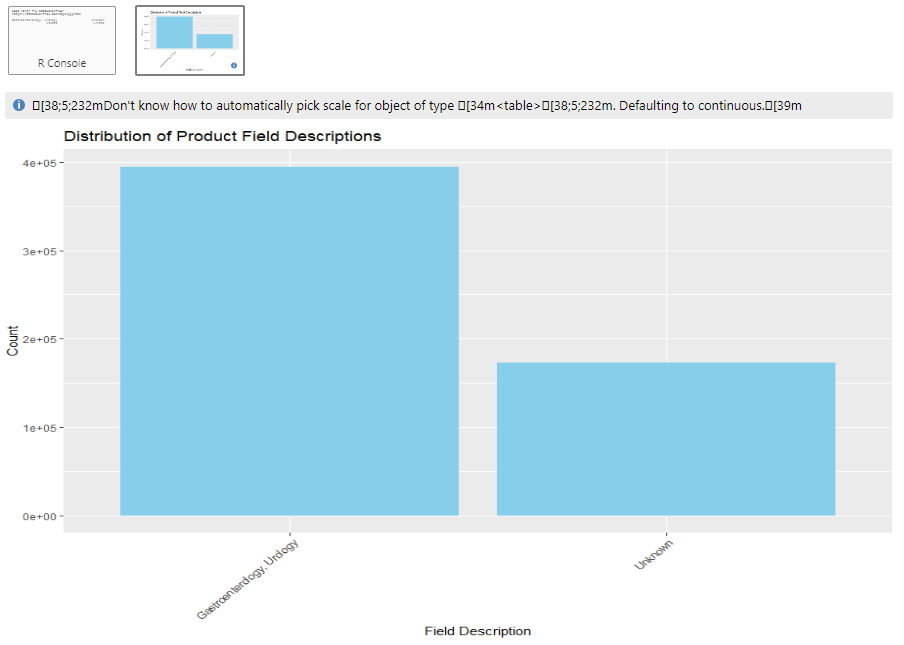

In [ ]:
```{r}
# Plot the distribution of product issue type
ggplot(categorical_df, aes(x = `product.issue.type`)) +
  geom_bar(fill = "skyblue", color = "black") +
  labs(title = "Distribution of Product Issue Type",
       x = "Product Issue Type",
       y = "Frequency") +
  theme_minimal()
```

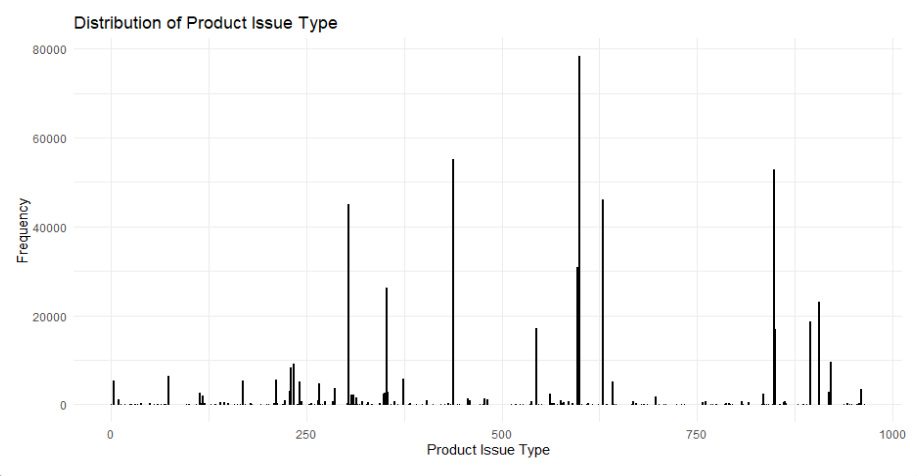

In [ ]:
```{r}
ggplot(categorical_df, aes(x = Proudct.issue.consequence)) +
 geom_bar(fill="dodgerblue") +
 labs(title = "Distribution of Product Brand Name", x= "Brand Name")+theme_bw()
```

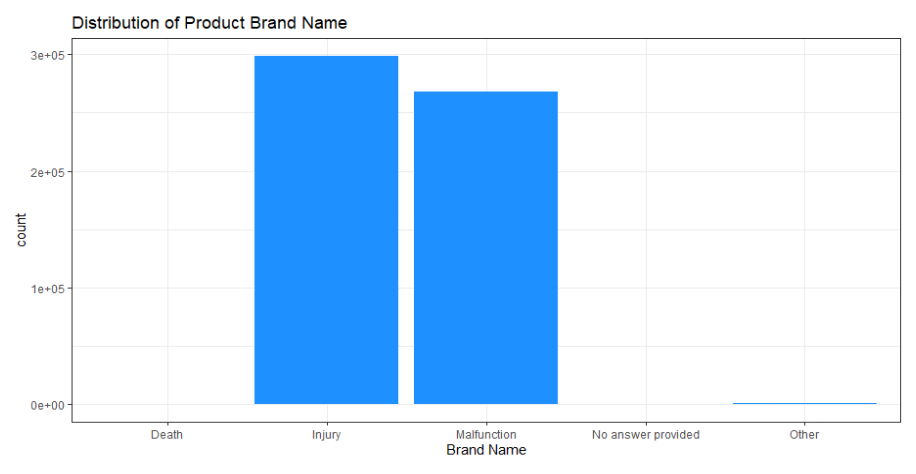

In [ ]:
```{r}


library(dplyr)
selected_non_categorical <- non_categorical_df %>%
  select(date_event)

# Select specific columns from categorical_df
selected_categorical <- categorical_df %>%
  select(Proudct.issue.consequence)

# Combine the selected columns into a new data frame
new_df <- cbind(selected_non_categorical, selected_categorical)

# Convert date_event column to date format
new_df$date_event <- as.Date(new_df$date_event, format = "%d/%m/%Y")

# Extract year from date_event
new_df$year <- format(new_df$date_event, "%Y")

# Filter data for rows with Proudct.issue.consequence as Death
death_data <- new_df %>% filter(Proudct.issue.consequence == "Death")

# Plot the graph
ggplot(death_data, aes(x = year)) +
  geom_bar(fill = "skyblue", color = "black") +
  labs(x = "Year", y = "Number of Deaths", title = "Number of Deaths by Year") +
  theme_minimal()
```

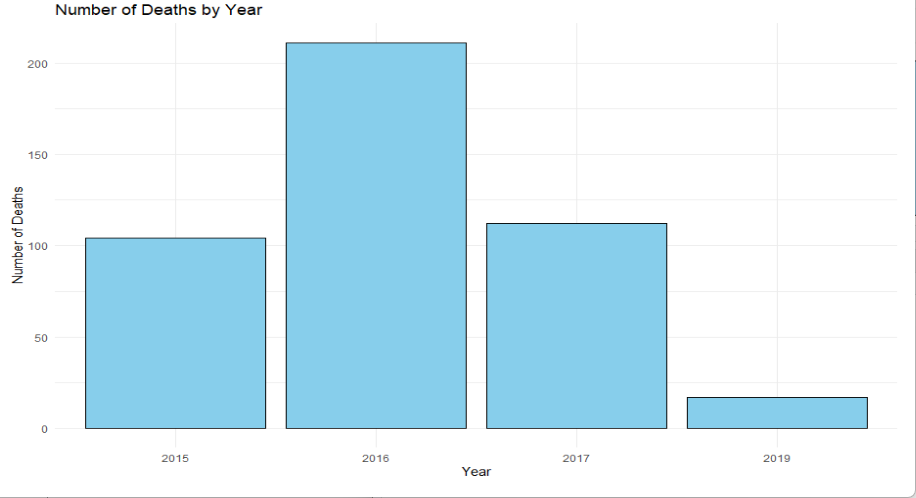

In [ ]:
```{r}

# Convert date_event column to date format
new_df$date_event <- as.Date(new_df$date_event, format = "%d/%m/%Y")

# Extract year from date_event
new_df$year <- format(new_df$date_event, "%Y")


# Plot the graph with stacked bars for all product consequence variables
ggplot(new_df, aes(x = year, fill = Proudct.issue.consequence)) +
  geom_bar(position = "stack") +
  labs(x = "Year", y = "Number of Cases", title = "Product Consequence Over the Years") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))
``

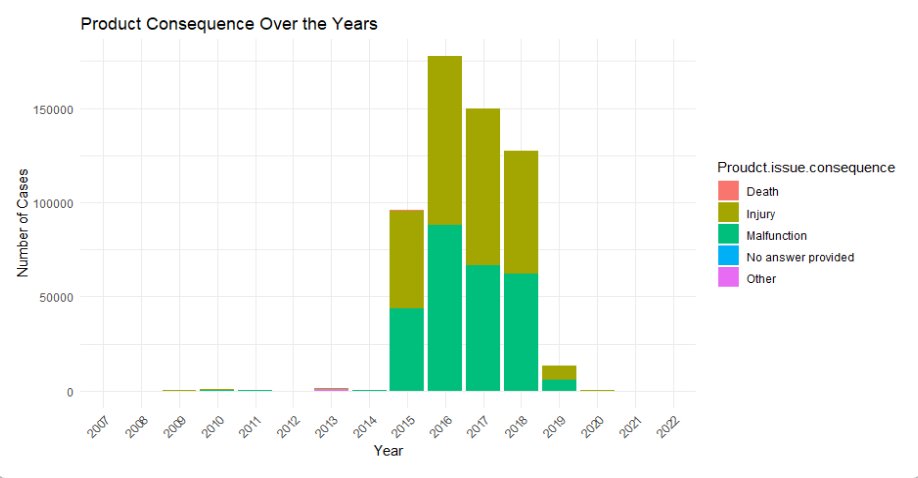

In [ ]:
```{r}
# 1. Check unique values and frequencies
Uniq_Iden <- table(categorical_df$ID_non_uniq)

# Print unique values and their frequencies
print(Uniq_Iden)

```

n970012 p000015 p000025 p020018 p030045 p060001 p080025 p090006 p090018 p110023 p130016 p840001 p960009 p960058 p970004 p970051
   1422      20   48636      44     187     252   30176      15    2040     432      54     338     200   51464  362024   70784

In [ ]:
```{r}



# Filter the data for rows with Proudct.issue.consequence as Death
death_data <- categorical_df %>%
  filter(Proudct.issue.consequence == "Death")

# Count the number of deaths for each ID_non_uniq
death_count <- death_data %>%
  group_by(ID_non_uniq) %>%
  summarise(Death_Count = n())

# Plot the bar plot
ggplot(death_count, aes(x = ID_non_uniq, y = Death_Count)) +
  geom_bar(stat = "identity", fill = "skyblue", color = "black") +
  labs(x = "ID_non_uniq", y = "Number of Deaths", title = "Number of Deaths by ID") +
  theme_minimal()

```

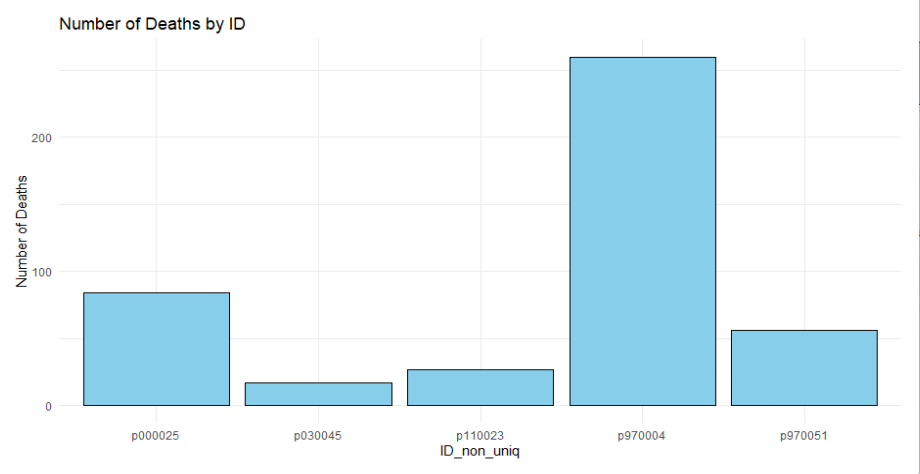

In [ ]:
```{r}
# Filter the data for rows with Proudct.issue.consequence as Death
Product_issue_data <- categorical_df %>%
  filter(Proudct.issue.consequence %in% c("Death", "Injury" , "Malfunction" , "Other"))

# Group by ID_non_uniq and Proudct.issue.consequence, and count the occurrences
issue_count <- Product_issue_data %>%
  group_by(ID_non_uniq, Proudct.issue.consequence) %>%
  summarise(Count = n())

# Plot the stacked bar plot
ggplot(issue_count, aes(x = ID_non_uniq, y = Count, fill = Proudct.issue.consequence)) +
  geom_bar(stat = "identity") +
  labs(x = "ID_non_uniq", y = "Count", title = "Stacked Bar Plot of Consequences by ID_non_uniq") +
  theme_minimal()+
  theme(axis.text.x = element_text(angle = 45, hjust = 1))
```

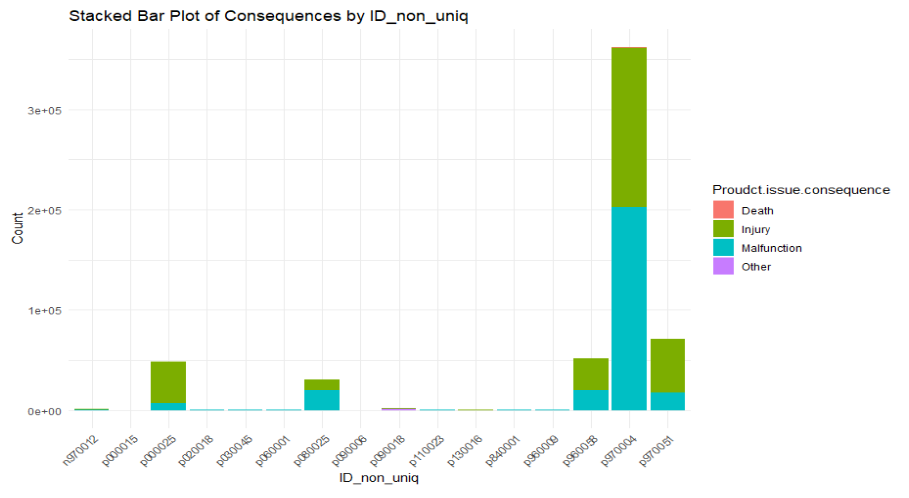

# Data preparation for applying statistical modeling

Now we will convert categorical variables into numerical variables

In [ ]:
install.packages("fastDummies")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
install.packages("kableExtra")


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:


# Load the Library
library(fastDummies)
df$product.field_description

library(kableExtra)
results <- fastDummies::dummy_cols(df, select_columns = "product.field_description")
df <- results
df$product.field_description <- NULL


Thank you for using fastDummies!

To acknowledge our work, please cite the package:

Kaplan, J. & Schlegel, B. (2023). fastDummies: Fast Creation of Dummy (Binary) Columns and Rows from Categorical Variables. Version 1.7.1. URL: https://github.com/jacobkap/fastDummies, https://jacobkap.github.io/fastDummies/.



[1] "Unknown"                   "Unknown"                  
    [3] "Unknown"                   "Unknown"                  
    [5] "Unknown"                   "Unknown"                  
    [7] "Unknown"                   "Gastroenterology, Urology"
    [9] "Gastroenterology, Urology" "Unknown"                  
   [11] "Unknown"                   "Unknown"                  
   [13] "Unknown"                   "Unknown"                  
   [15] "Unknown"                   "Unknown"                  
   [17] "Gastroenterology, Urology" "Gastroenterology, Urology"
   [19] "Unknown"                   "Unknown"                  
   [21] "Unknown"                   "Unknown"                  
   [23] "Unknown"                   "Unknown"                  
   [25] "Unknown"                   "Gastroenterology, Urology"
   [27] "Unknown"                   "Unknown"                  
   [29] "Unknown"                   "Unknown"                  
   [31] "Unknown"                   "Unknown"                  
   [33] "Unknown"                   "Gastroenterology, Urology"
   [35] "Gastroenterology, Urology" "Gastroenterology, Urology"
   [37] "Gastroenterology, Urology" "Unknown"                  
   [39] "Unknown"                   "Unknown"                  
   [41] "Unknown"                   "Unknown"                  
   [43] "Unknown"                   "Unknown"                  
   [45] "Gastroenterology, Urology" "Gastroenterology, Urology"
   [47] "Unknown"                   "Unknown"                  
   [49] "Unknown"                   "Unknown"                  
   [51] "Unknown"                   "Unknown"                  
   [53] "Unknown"                   "Gastroenterology, Urology"
   [55] "Gastroenterology, Urology" "Unknown"                  
   [57] "Unknown"                   "Unknown"                  
   [59] "Unknown"                   "Unknown"                  
   [61] "Unknown"                   "Unknown"                  
   [63] "Gastroenterology, Urology" "Gastroenterology, Urology"
   [65] "Gastroenterology, Urology" "Unknown"                  
   [67] "Unknown"                   "Unknown"                  
   [69] "Unknown"                   "Unknown"                  
   [71] "Unknown"                   "Unknown"                  
   [73] "Gastroenterology, Urology" "Gastroenterology, Urology"
   [75] "Gastroenterology, Urology" "Gastroenterology, Urology"
   [77] "Gastroenterology, Urology" "Gastroenterology, Urology"
   [79] "Unknown"                   "Unknown"                  
   [81] "Unknown"                   "Unknown"                  
   [83] "Unknown"                   "Unknown"                  
   [85] "Unknown"                   "Gastroenterology, Urology"
   [87] "Gastroenterology, Urology" "Unknown"                  
   [89] "Unknown"                   "Unknown"                  
   [91] "Unknown"                   "Unknown"                  
   [93] "Unknown"                   "Unknown"                  
   [95] "Gastroenterology, Urology" "Gastroenterology, Urology"
   [97] "Unknown"                   "Unknown"                  
   [99] "Unknown"                   "Unknown"                  
  [101] "Unknown"                   "Unknown"                  
  [103] "Unknown"                   "Gastroenterology, Urology"
  [105] "Gastroenterology, Urology" "Unknown"                  
  [107] "Unknown"                   "Unknown"                  
  [109] "Unknown"                   "Unknown"                  
  [111] "Unknown"                   "Unknown"                  
  [113] "Gastroenterology, Urology" "Unknown"                  
  [115] "Unknown"                   "Unknown"                  
  [117] "Unknown"                   "Unknown"                  
  [119] "Unknown"                   "Unknown"                  
  [121] "Gastroenterology, Urology" "Gastroenterology, Urology"
  [123] "Unknown"                   "Unknown"                  
  [125] "Unknown"                   

In [ ]:
df$product.product_report_product_code

library(kableExtra)
results <- fastDummies::dummy_cols(df, select_columns = "product.product_report_product_code")
df <- results
df$product.product_report_product_code  <- NULL

[1] "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "FGE" "FGE" "OAF" "OAF" "OAF"
   [13] "OAF" "OAF" "OAF" "OAF" "FGE" "FGE" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF"
   [25] "OAF" "FGE" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "FGE" "FGE" "FGE"
   [37] "FGE" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "FGE" "FGE" "OAF" "OAF"
   [49] "OAF" "OAF" "OAF" "OAF" "OAF" "FGE" "FGE" "OAF" "OAF" "OAF" "OAF" "OAF"
   [61] "OAF" "OAF" "FGE" "FGE" "FGE" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF"
   [73] "FGE" "FGE" "FGE" "FGE" "FGE" "FGE" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF"
   [85] "OAF" "FGE" "FGE" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "FGE" "FGE"
   [97] "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "FGE" "FGE" "OAF" "OAF" "OAF"
  [109] "OAF" "OAF" "OAF" "OAF" "FGE" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF"
  [121] "FGE" "FGE" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "FGE" "FGE" "OAF"
  [133] "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "FGE" "FGE" "OAF" "OAF" "OAF" "OAF"
  [145] "OAF" "OAF" "OAF" "FGE" "FGE" "FGE" "FGE" "FGE" "FGE" "OAF" "OAF" "OAF"
  [157] "OAF" "OAF" "OAF" "OAF" "FGE" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF"
  [169] "FGE" "FGE" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "FGE" "OAF" "OAF"
  [181] "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF"
  [193] "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "EZW"
  [205] "MCM" "MCM" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF"
  [217] "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "EZW" "MCM" "MCM" "OAF"
  [229] "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF"
  [241] "OAF" "OAF" "OAF" "OAF" "OAF" "EZW" "MCM" "MCM" "OAF" "OAF" "OAF" "OAF"
  [253] "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF"
  [265] "OAF" "OAF" "EZW" "MCM" "MCM" "EZW" "MCM" "MCM" "OAF" "OAF" "OAF" "OAF"
  [277] "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF"
  [289] "OAF" "OAF" "EZW" "MCM" "MCM" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF"
  [301] "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "EZW"
  [313] "MCM" "MCM" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF"
  [325] "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "EZW" "MCM" "MCM" "EZW"
  [337] "MCM" "MCM" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF"
  [349] "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "EZW" "MCM" "MCM" "EZW"
  [361] "MCM" "MCM" "EZW" "MCM" "MCM" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF"
  [373] "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "EZW"
  [385] "MCM" "MCM" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF"
  [397] "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "EZW" "MCM" "MCM" "OAF"
  [409] "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF"
  [421] "OAF" "OAF" "OAF" "OAF" "OAF" "EZW" "MCM" "MCM" "EZW" "MCM" "MCM" "OAF"
  [433] "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF"
  [445] "OAF" "OAF" "OAF" "OAF" "OAF" "EZW" "MCM" "MCM" "OAF" "OAF" "OAF" "OAF"
  [457] "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF"
  [469] "OAF" "OAF" "EZW" "MCM" "MCM" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF"
  [481] "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "EZW"
  [493] "MCM" "MCM" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF"
  [505] "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "EZW" "MCM" "MCM" "OAF"
  [517] "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF"
  [529] "OAF" "OAF" "OAF" "OAF" "OAF" "EZW" "MCM" "MCM" "EZW" "MCM" "MCM" "EZW"
  [541] "MCM" "MCM" "EZW" "MCM" "MCM" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF"
  [553] "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "EZW"
  [565] "MCM" "MCM" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF"
  [577] "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "EZW" "MCM" "MCM" "OAF"
  [589] "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF" "OAF"
  [6

In [ ]:
df$Proudct.issue.consequence

results <- fastDummies::dummy_cols(df, select_columns = "Proudct.issue.consequence")
df <- results

df$Proudct.issue.consequence <- NULL

[1] "Other"              "Other"              "Other"             
    [4] "Malfunction"        "Other"              "Malfunction"       
    [7] "Other"              "Injury"             "Injury"            
   [10] "Other"              "Other"              "Other"             
   [13] "Malfunction"        "Other"              "Malfunction"       
   [16] "Other"              "Injury"             "Injury"            
   [19] "Other"              "Other"              "Other"             
   [22] "Malfunction"        "Other"              "Malfunction"       
   [25] "Other"              "Injury"             "Other"             
   [28] "Other"              "Other"              "Malfunction"       
   [31] "Other"              "Malfunction"        "Other"             
   [34] "Injury"             "Injury"             "Injury"            
   [37] "Injury"             "Other"              "Other"             
   [40] "Other"              "Malfunction"        "Other"             
   [43] "Malfunction"        "Other"              "Injury"            
   [46] "Injury"             "Other"              "Other"             
   [49] "Other"              "Malfunction"        "Other"             
   [52] "Malfunction"        "Other"              "Injury"            
   [55] "Injury"             "Other"              "Other"             
   [58] "Other"              "Malfunction"        "Other"             
   [61] "Malfunction"        "Other"              "Injury"            
   [64] "Injury"             "Injury"             "Other"             
   [67] "Other"              "Other"              "Malfunction"       
   [70] "Other"              "Malfunction"        "Other"             
   [73] "Injury"             "Injury"             "Injury"            
   [76] "Injury"             "Injury"             "Injury"            
   [79] "Other"              "Other"              "Other"             
   [82] "Malfunction"        "Other"              "Malfunction"       
   [85] "Other"              "Injury"             "Injury"            
   [88] "Other"              "Other"              "Other"             
   [91] "Malfunction"        "Other"              "Malfunction"       
   [94] "Other"              "Injury"             "Injury"            
   [97] "Other"              "Other"              "Other"             
  [100] "Malfunction"        "Other"              "Malfunction"       
  [103] "Other"              "Injury"             "Injury"            
  [106] "Other"              "Other"              "Other"             
  [109] "Malfunction"        "Other"              "Malfunction"       
  [112] "Other"              "Injury"             "Other"             
  [115] "Other"              "Other"              "Malfunction"       
  [118] "Other"              "Malfunction"        "Other"             
  [121] "Injury"             "Injury"             "Other"             
  [124] "Other"              "Other"              "Malfunction"       
  [127] "Other"              "Malfunction"        "Other"             
  [130] "Injury"             "Injury"             "Other"             
  [133] "Other"              "Other"              "Malfunction"       
  [136] "Other"              "Malfunction"        "Other"             
  [139] "Injury"             "Injury"             "Other"             
  [142] "Other"              "Other"              "Malfunction"       
  [145] "Other"              "Malfunction"        "Other"             
  [148] "Injury"             "Injury"             "Injury"            
  [151] "Injury"             "Injury"             "Injury"            
  [154] "Other"              "Other"              "Other"             
  [157] "Malfunction"        "Other"              "Malfunction"       
  [160] "Other"              "Injury"             "Other"             
  [163] "Other"              "Other"              "Malfunction"       
  [166] "Other"              "Malfunction"        "Other"             
  [169] "Injury"            

In [ ]:




df$manufacturer_contact_address_1
results <- fastDummies::dummy_cols(df, select_columns = "manufacturer_contact_address_1")
df <- results
df$manufacturer_contact_address_1 <- NULL


df$product.brand_name
results <- fastDummies::dummy_cols(df, select_columns = "product.brand_name")
df <- results
df$product.brand_name <- NULL


df$product.generic_name
results <- fastDummies::dummy_cols(df, select_columns = "product.generic_name")
df <- results
df$product.generic_name <- NULL


df$product.issue.type
results <- fastDummies::dummy_cols(df, select_columns = "product.issue.type")
df <- results
df$product.issue.type <- NULL


df$type_of_report.1
results <- fastDummies::dummy_cols(df, select_columns = "type_of_report.1")
df <- results
df$type_of_report.1 <- NULL


df$reporter_job_code
results <- fastDummies::dummy_cols(df, select_columns = "reporter_job_code")
df <- results
df$reporter_job_code <- NULL


df$source_type
results <- fastDummies::dummy_cols(df, select_columns = "source_type")
df <- results
df$source_type <- NULL

df$product.manufacturer_name
results <- fastDummies::dummy_cols(df, select_columns = "product.manufacturer_name")
df <- results
df$product.manufacturer_name<- NULL


df$product.product_operator
results <- fastDummies::dummy_cols(df, select_columns = "product.product_operator")
df <- results
df$product.product_operator <- NULL


df$product.manufacturer_city
results <- fastDummies::dummy_cols(df, select_columns = "product.manufacturer_city")
df <- results
df$product.manufacturer_city <- NULL


df$product.manufacturer_state
results <- fastDummies::dummy_cols(df, select_columns = "product.manufacturer_state")
df <- results
df$product.manufacturer_state <- NULL


df$product.manufacturer_country
results <- fastDummies::dummy_cols(df, select_columns = "product.manufacturer_country")
df <- results
df$product.manufacturer_country <- NULL







[1]  7479  7479  7479  7479  7479  7479  7479  7073  7073  7479  7479  7479
   [13]  7479  7479  7479  7479  7073  7073  7479  7479  7479  7479  7479  7479
   [25]  7479  7073  7479  7479  7479  7479  7479  7479  7479  7073  7073  7073
   [37]  7073  7479  7479  7479  7479  7479  7479  7479  7073  7073  7479  7479
   [49]  7479  7479  7479  7479  7479  7073  7073  7479  7479  7479  7479  7479
   [61]  7479  7479  7073  7073  7073  7479  7479  7479  7479  7479  7479  7479
   [73]  7073  7073  7073  7073  7073  7073  7479  7479  7479  7479  7479  7479
   [85]  7479  7073  7073  7479  7479  7479  7479  7479  7479  7479  7073  7073
   [97]  7479  7479  7479  7479  7479  7479  7479  7073  7073  7479  7479  7479
  [109]  7479  7479  7479  7479  7073  7479  7479  7479  7479  7479  7479  7479
  [121]  7073  7073  7479  7479  7479  7479  7479  7479  7479  7073  7073  7479
  [133]  7479  7479  7479  7479  7479  7479  7073  7073  7479  7479  7479  7479
  [145]  7479  7479  7479  7073  7073  7073  7073  7073  7073  7479  7479  7479
  [157]  7479  7479  7479  7479  7073  7479  7479  7479  7479  7479  7479  7479
  [169]  7073  7073  7479  7479  7479  7479  7479  7479  7479  7073  7479  7479
  [181]  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479
  [193]  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  9476
  [205]  1559  1559  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479
  [217]  7479  7479  7479  7479  7479  7479  7479  7479  9476  1559  1559  7479
  [229]  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479
  [241]  7479  7479  7479  7479  7479  9476  1559  1559  7479  7479  7479  7479
  [253]  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479
  [265]  7479  7479  9476  1559  1559  9476  1559  1559  7479  7479  7479  7479
  [277]  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479
  [289]  7479  7479  9476  1559  1559  7479  7479  7479  7479  7479  7479  7479
  [301]  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  9476
  [313]  1559  1559  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479
  [325]  7479  7479  7479  7479  7479  7479  7479  7479  9476  1559  1559  9476
  [337]  1559  1559  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479
  [349]  7479  7479  7479  7479  7479  7479  7479  7479  9476  1559  1559  9476
  [361]  1559  1559  9476  1559  1559  7479  7479  7479  7479  7479  7479  7479
  [373]  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  9476
  [385]  1559  1559  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479
  [397]  7479  7479  7479  7479  7479  7479  7479  7479  9476  1559  1559  7479
  [409]  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479
  [421]  7479  7479  7479  7479  7479  9476  1559  1559  9476  1559  1559  7479
  [433]  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479
  [445]  7479  7479  7479  7479  7479  9476  1559  1559  7479  7479  7479  7479
  [457]  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479
  [469]  7479  7479  9476  1559  1559  7479  7479  7479  7479  7479  7479  7479
  [481]  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  9476
  [493]  1559  1559  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479
  [505]  7479  7479  7479  7479  7479  7479  7479  7479  9476  1559  1559  7479
  [517]  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479
  [529]  7479  7479  7479  7479  7479  9476  1559  1559  9476  1559  1559  9476
  [541]  1559  1559  9476  1559  1559  7479  7479  7479  7479  7479  7479  7479
  [553]  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  9476
  [565]  1559  1559  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479
  [577]  7479  7479  7479  7479  7479  7479  7479  7479  9476  1559  1559  7479
  [589]  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479  7479
  [6

[1] 118089 118089 118089 118089 118089 118089 118089 239100 239095 118089
   [11] 118089 118089 118089 118089 118089 118089 239100 239095 118089 118089
   [21] 118089 118089 118089 118089 118089 239100 118089 118089 118089 118089
   [31] 118089 118089 118089 239100 239095 239100 239095 118089 118089 118089
   [41] 118089 118089 118089 118089 239100 239095 118089 118089 118089 118089
   [51] 118089 118089 118089 239100 239095 118089 118089 118089 118089 118089
   [61] 118089 118089 239100 239095 239100 118089 118089 118089 118089 118089
   [71] 118089 118089 239100 239095 239100 239095 239100 239095 118089 118089
   [81] 118089 118089 118089 118089 118089 239100 239095 118089 118089 118089
   [91] 118089 118089 118089 118089 239100 239095 118089 118089 118089 118089
  [101] 118089 118089 118089 239100 239100 118089 118089 118089 118089 118089
  [111] 118089 118089 239100 118089 118089 118089 118089 118089 118089 118089
  [121] 239100 239095 118089 118089 118089 118089 118089 118089 118089 239100
  [131] 239095 118089 118089 118089 118089 118089 118089 118089 239100 239095
  [141] 118089 118089 118089 118089 118089 118089 118089 239100 239100 239095
  [151] 239100 239095 239100 118089 118089 118089 118089 118089 118089 118089
  [161] 239100 118089 118089 118089 118089 118089 118089 118089 239100 239095
  [171] 118089 118089 118089 118089 118089 118089 118089 239100 118089 118089
  [181] 118089 118089 118089 118089 118089 118089 118089 118089 118089 118089
  [191] 118089 118089 118089 118089 118089 118089 118089 118089 118089 118089
  [201] 118089 118089 118353 158472 146869 146869 118089 118089 118089 118089
  [211] 118089 118089 118089 118089 118089 118089 118089 118089 118089 118089
  [221] 118089 118089 118089 118353 158472 146869 146869 118089 118089 118089
  [231] 118089 118089 118089 118089 118089 118089 118089 118089 118089 118089
  [241] 118089 118089 118089 118089 118353 158472 146869 146869 118089 118089
  [251] 118089 118089 118089 118089 118089 118089 118089 118089 118089 118089
  [261] 118089 118089 118089 118089 118089 118353 158472 146869 146869 158472
  [271] 146869 146869 118089 118089 118089 118089 118089 118089 118089 118089
  [281] 118089 118089 118089 118089 118089 118089 118089 118089 118089 118353
  [291] 158472 146869 146869 118089 118089 118089 118089 118089 118089 118089
  [301] 118089 118089 118089 118089 118089 118089 118089 118089 118089 118089
  [311] 118353 158472 146869 146869 118089 118089 118089 118089 118089 118089
  [321] 118089 118089 118089 118089 118089 118089 118089 118089 118089 118089
  [331] 118089 118353 158472 146869 146869 158472 146869 146869 118089 118089
  [341] 118089 118089 118089 118089 118089 118089 118089 118089 118089 118089
  [351] 118089 118089 118089 118089 118089 118353 158472 146869 146869 158472
  [361] 146869 146869 158472 146869 146869 118089 118089 118089 118089 118089
  [371] 118089 118089 118089 118089 118089 118089 118089 118089 118089 118089
  [381] 118089 118089 118353 158472 146869 146869 118089 118089 118089 118089
  [391] 118089 118089 118089 118089 118089 118089 118089 118089 118089 118089
  [401] 118089 118089 118089 118353 158472 146869 146869 118089 118089 118089
  [411] 118089 118089 118089 118089 118089 118089 118089 118089 118089 118089
  [421] 118089 118089 118089 118089 118353 158472 146869 146869 158472 146869
  [431] 146869 118089 118089 118089 118089 118089 118089 118089 118089 118089
  [441] 118089 118089 118089 118089 118089 118089 118089 118089 118353 158472
  [451] 146869 146869 118089 118089 118089 118089 118089 118089 118089 118089
  [461] 118089 118089 118089 118089 118089 118089 118089 118089 118089 118353
  [471] 158472 146869 146869 118089 118089 118089 118089 118089 118089 118089
  [481] 118089 118089 118089 118089 118089 118089 118089 118089 118089 118089
  [491] 118353 158472 146869 146869 118089 118089 118089 118089 118089 118089
  [501] 118089 118089 118089 118089 118089 118089 118089 118089 118089 118089
  [511] 118089 118353 1584

[1] 101028 101028 101028 101028 101028 101028 101028  16454  16454 101028
   [11] 101028 101028 101028 101028 101028 101028  16454  16454 101028 101028
   [21] 101028 101028 101028 101028 101028  16454 101028 101028 101028 101028
   [31] 101028 101028 101028  16454  16454  16454  16454 101028 101028 101028
   [41] 101028 101028 101028 101028  16454  16454 101028 101028 101028 101028
   [51] 101028 101028 101028  16454  16454 101028 101028 101028 101028 101028
   [61] 101028 101028  16454  16454  16454 101028 101028 101028 101028 101028
   [71] 101028 101028  16454  16454  16454  16454  16454  16454 101028 101028
   [81] 101028 101028 101028 101028 101028  16454  16454 101028 101028 101028
   [91] 101028 101028 101028 101028  16454  16454 101028 101028 101028 101028
  [101] 101028 101028 101028  16454  16454 101028 101028 101028 101028 101028
  [111] 101028 101028  16454 101028 101028 101028 101028 101028 101028 101028
  [121]  16454  16454 101028 101028 101028 101028 101028 101028 101028  16454
  [131]  16454 101028 101028 101028 101028 101028 101028 101028  16454  16454
  [141] 101028 101028 101028 101028 101028 101028 101028  16454  16454  16454
  [151]  16454  16454  16454 101028 101028 101028 101028 101028 101028 101028
  [161]  16454 101028 101028 101028 101028 101028 101028 101028  16454  16454
  [171] 101028 101028 101028 101028 101028 101028 101028  16454 101028 101028
  [181] 101028 101028 101028 101028 101028 101028 101028 101028 101028 101028
  [191] 101028 101028 101028 101028 101028 101028 101028 101028 101028 101028
  [201] 101028 101028 101028  84946  19531  19531 101028 101028 101028 101028
  [211] 101028 101028 101028 101028 101028 101028 101028 101028 101028 101028
  [221] 101028 101028 101028 101028  84946  19531  19531 101028 101028 101028
  [231] 101028 101028 101028 101028 101028 101028 101028 101028 101028 101028
  [241] 101028 101028 101028 101028 101028  84946  19531  19531 101028 101028
  [251] 101028 101028 101028 101028 101028 101028 101028 101028 101028 101028
  [261] 101028 101028 101028 101028 101028 101028  84946  19531  19531  84946
  [271]  19531  19531 101028 101028 101028 101028 101028 101028 101028 101028
  [281] 101028 101028 101028 101028 101028 101028 101028 101028 101028 101028
  [291]  84946  19531  19531 101028 101028 101028 101028 101028 101028 101028
  [301] 101028 101028 101028 101028 101028 101028 101028 101028 101028 101028
  [311] 101028  84946  19531  19531 101028 101028 101028 101028 101028 101028
  [321] 101028 101028 101028 101028 101028 101028 101028 101028 101028 101028
  [331] 101028 101028  84946  19531  19531  84946  19531  19531 101028 101028
  [341] 101028 101028 101028 101028 101028 101028 101028 101028 101028 101028
  [351] 101028 101028 101028 101028 101028 101028  84946  19531  19531  84946
  [361]  19531  19531  84946  19531  19531 101028 101028 101028 101028 101028
  [371] 101028 101028 101028 101028 101028 101028 101028 101028 101028 101028
  [381] 101028 101028 101028  84946  19531  19531 101028 101028 101028 101028
  [391] 101028 101028 101028 101028 101028 101028 101028 101028 101028 101028
  [401] 101028 101028 101028 101028  84946  19531  19531 101028 101028 101028
  [411] 101028 101028 101028 101028 101028 101028 101028 101028 101028 101028
  [421] 101028 101028 101028 101028 101028  84946  19531  19531  84946  19531
  [431]  19531 101028 101028 101028 101028 101028 101028 101028 101028 101028
  [441] 101028 101028 101028 101028 101028 101028 101028 101028 101028  84946
  [451]  19531  19531 101028 101028 101028 101028 101028 101028 101028 101028
  [461] 101028 101028 101028 101028 101028 101028 101028 101028 101028 101028
  [471]  84946  19531  19531 101028 101028 101028 101028 101028 101028 101028
  [481] 101028 101028 101028 101028 101028 101028 101028 101028 101028 101028
  [491] 101028  84946  19531  19531 101028 101028 101028 101028 101028 101028
  [501] 101028 101028 101028 101028 101028 101028 101028 101028 101028 101028
  [511] 101028 101028  849

[1] 596 598 596 757 590 599 590 596 374 596 598 596 757 590 599 590 596 374
   [19] 596 598 596 757 590 599 590 596 596 598 596 757 590 599 590 596 374 596
   [37] 374 596 598 596 757 590 599 590 596 374 596 598 596 757 590 599 590 596
   [55] 374 596 598 596 757 590 599 590 596 374 596 596 598 596 757 590 599 590
   [73] 596 374 596 374 596 374 596 598 596 757 590 599 590 596 374 596 598 596
   [91] 757 590 599 590 596 374 596 598 596 757 590 599 590 596 596 596 598 596
  [109] 757 590 599 590 596 596 598 596 757 590 599 590 596 374 596 598 596 757
  [127] 590 599 590 596 374 596 598 596 757 590 599 590 596 374 596 598 596 757
  [145] 590 599 590 596 596 374 596 374 596 596 598 596 757 590 599 590 596 596
  [163] 598 596 757 590 599 590 596 374 596 598 596 757 590 599 590 596 596 598
  [181] 596 757 590 599 590 599 599 596 596 599 599 168 168 596 599 599 596 599
  [199] 590 590 590 590 312 544 459 575 599 599 596 596 599 599 168 168 596 599
  [217] 599 596 599 590 590 590 590 312 544 459 575 599 599 596 596 599 599 168
  [235] 168 596 599 599 596 599 590 590 590 590 312 544 459 575 599 599 596 596
  [253] 599 599 168 168 596 599 599 596 599 590 590 590 590 312 544 459 575 544
  [271] 459 575 599 599 596 596 599 599 168 168 596 599 599 596 599 590 590 590
  [289] 590 312 544 459 575 599 599 596 596 599 599 168 168 596 599 599 596 599
  [307] 590 590 590 590 312 544 459 575 599 599 596 596 599 599 168 168 596 599
  [325] 599 596 599 590 590 590 590 312 544 459 575 544 459 575 599 599 596 596
  [343] 599 599 168 168 596 599 599 596 599 590 590 590 590 312 544 459 575 544
  [361] 459 575 544 459 575 599 599 596 596 599 599 168 168 596 599 599 596 599
  [379] 590 590 590 590 312 544 459 575 599 599 596 596 599 599 168 168 596 599
  [397] 599 596 599 590 590 590 590 312 544 459 575 599 599 596 596 599 599 168
  [415] 168 596 599 599 596 599 590 590 590 590 312 544 459 575 544 459 575 599
  [433] 599 596 596 599 599 168 168 596 599 599 596 599 590 590 590 590 312 544
  [451] 459 575 599 599 596 596 599 599 168 168 596 599 599 596 599 590 590 590
  [469] 590 312 544 459 575 599 599 596 596 599 599 168 168 596 599 599 596 599
  [487] 590 590 590 590 312 544 459 575 599 599 596 596 599 599 168 168 596 599
  [505] 599 596 599 590 590 590 590 312 544 459 575 599 599 596 596 599 599 168
  [523] 168 596 599 599 596 599 590 590 590 590 312 544 459 575 544 459 575 544
  [541] 459 575 544 459 575 599 599 596 596 599 599 168 168 596 599 599 596 599
  [559] 590 590 590 590 312 544 459 575 599 599 596 596 599 599 168 168 596 599
  [577] 599 596 599 590 590 590 590 312 544 459 575 599 599 596 596 599 599 168
  [595] 168 596 599 599 596 599 590 590 590 590 312 459 575 599 599 596 596 599
  [613] 599 168 168 596 599 599 596 599 590 590 590 590 312 459 575 629 140 599
  [631] 964 312 312 590 596 598 629 140 599 964 312 312 590 596 598 629 140 599
  [649] 964 312 312 590 596 598 629 140 599 964 312 312 590 596 598 629 598 629
  [667] 140 599 964 312 312 590 596 598 629 140 599 964 312 312 590 596 598 629
  [685] 140 599 964 312 312 590 596 598 629 598 629 140 599 964 312 312 590 596
  [703] 598 629 598 629 598 629 140 599 964 312 312 590 596 598 629 140 599 964
  [721] 312 312 590 596 598 629 140 599 964 312 312 590 596 598 629 598 629 140
  [739] 599 964 312 312 590 596 598 629 140 599 964 312 312 590 596 598 629 140
  [757] 599 964 312 312 590 596 598 629 140 599 964 312 312 590 596 598 629 140
  [775] 599 964 312 312 590 596 598 629 598 629 598 629 598 629 140 599 964 312
  [793] 312 590 596 598 629 140 599 964 312 312 590 596 598 629 140 599 964 312
  [811] 312 590 596 629 140 599 964 312 312 590 596 960 590 590 590 590 544 960
  [829] 590 590 590 590 544 960 590 590 590 590 544 960 590 590 590 590 544 544
  [847] 960 590 590 590 590 544 960 590 590 590 590 544 960 590 590 590 590 544
  [865] 544 960 590 590 590 590 544 544 544 960 590 590 590 590 544 960 590 590
  [883] 590 590 544 960 590 590 590 590 544 544 960 590 590 590 590 544 960 590
  [9

[1] 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 0 0
   [37] 0 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 0 0 0 1 1 1 1 1 1 1
   [73] 0 0 0 0 0 0 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 0 0 1 1 1
  [109] 1 1 1 1 0 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 0 0 1 1 1 1
  [145] 1 1 1 0 0 0 0 0 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 0 1 1
  [181] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1
  [217] 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1
  [253] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  [289] 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1
  [325] 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0
  [361] 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1
  [397] 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1
  [433] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  [469] 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1
  [505] 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 0
  [541] 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1
  [577] 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  [613] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1
  [649] 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1
  [685] 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 0 1 0 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1
  [721] 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1
  [757] 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 0 1 0 1 0 1 1 1 1 1
  [793] 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 0
  [829] 1 1 1 1 0 0 1 1 1 1 0 0 1 1 1 1 0 0 0 1 1 1 1 0 0 1 1 1 1 0 0 1 1 1 1 0
  [865] 0 0 1 1 1 1 0 0 0 0 1 1 1 1 0 0 1 1 1 1 0 0 1 1 1 1 0 0 0 1 1 1 1 0 0 1
  [901] 1 1 1 0 0 1 1 1 1 0 0 1 1 1 1 0 0 1 1 1 1 0 0 0 0 0 1 1 1 1 0 0 1 1 1 1
  [937] 0 0 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  [973] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1009] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1045] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1081] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1117] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1153] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1189] 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 0 1 1 1
 [1225] 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1 0 0 0
 [1261] 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1
 [1297] 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1
 [1333] 0 0 0 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1369] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1405] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1441] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1477] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1513] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1549] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1585] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1621] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1657] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1693] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1729] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [1765] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [18

[1] 34 34 34 42 34 42 34 32 32 34 34 34 42 34 42 34 32 32 34 34 34 42 34 42
   [25] 34 32 34 34 34 42 34 42 34 32 32 32 32 34 34 34 42 34 42 34 32 32 34 34
   [49] 34 42 34 42 34 32 32 34 34 34 42 34 42 34 32 32 32 34 34 34 42 34 42 34
   [73] 32 32 32 32 32 32 34 34 34 42 34 42 34 32 32 34 34 34 42 34 42 34 32 32
   [97] 34 34 34 42 34 42 34 32 32 34 34 34 42 34 42 34 32 34 34 34 42 34 42 34
  [121] 32 32 34 34 34 42 34 42 34 32 32 34 34 34 42 34 42 34 32 32 34 34 34 42
  [145] 34 42 34 32 32 32 32 32 32 34 34 34 42 34 42 34 32 34 34 34 42 34 42 34
  [169] 32 32 34 34 34 42 34 42 34 32 34 34 34 42 34 42 34 34 34 34 42 42 42 42
  [193] 42 42 42 42 42 42 34 42 34 34 34 32  9 32 34 34 34 42 42 42 42 42 42 42
  [217] 42 42 42 34 42 34 34 34 32  9 32 34 34 34 42 42 42 42 42 42 42 42 42 42
  [241] 34 42 34 34 34 32  9 32 34 34 34 42 42 42 42 42 42 42 42 42 42 34 42 34
  [265] 34 34 32  9 32 32  9 32 34 34 34 42 42 42 42 42 42 42 42 42 42 34 42 34
  [289] 34 34 32  9 32 34 34 34 42 42 42 42 42 42 42 42 42 42 34 42 34 34 34 32
  [313]  9 32 34 34 34 42 42 42 42 42 42 42 42 42 42 34 42 34 34 34 32  9 32 32
  [337]  9 32 34 34 34 42 42 42 42 42 42 42 42 42 42 34 42 34 34 34 32  9 32 32
  [361]  9 32 32  9 32 34 34 34 42 42 42 42 42 42 42 42 42 42 34 42 34 34 34 32
  [385]  9 32 34 34 34 42 42 42 42 42 42 42 42 42 42 34 42 34 34 34 32  9 32 34
  [409] 34 34 42 42 42 42 42 42 42 42 42 42 34 42 34 34 34 32  9 32 32  9 32 34
  [433] 34 34 42 42 42 42 42 42 42 42 42 42 34 42 34 34 34 32  9 32 34 34 34 42
  [457] 42 42 42 42 42 42 42 42 42 34 42 34 34 34 32  9 32 34 34 34 42 42 42 42
  [481] 42 42 42 42 42 42 34 42 34 34 34 32  9 32 34 34 34 42 42 42 42 42 42 42
  [505] 42 42 42 34 42 34 34 34 32  9 32 34 34 34 42 42 42 42 42 42 42 42 42 42
  [529] 34 42 34 34 34 32  9 32 32  9 32 32  9 32 32  9 32 34 34 34 42 42 42 42
  [553] 42 42 42 42 42 42 34 42 34 34 34 32  9 32 34 34 34 42 42 42 42 42 42 42
  [577] 42 42 42 34 42 34 34 34 32  9 32 34 34 34 42 42 42 42 42 42 42 42 42 42
  [601] 34 42 34 34 34  9 32 34 34 34 42 42 42 42 42 42 42 42 42 42 34 42 34 34
  [625] 34  9 32 32 26 34 42 34 42 34 34 32 32 26 34 42 34 42 34 34 32 32 26 34
  [649] 42 34 42 34 34 32 32 26 34 42 34 42 34 34 32 32 32 32 26 34 42 34 42 34
  [673] 34 32 32 26 34 42 34 42 34 34 32 32 26 34 42 34 42 34 34 32 32 32 32 26
  [697] 34 42 34 42 34 34 32 32 32 32 32 32 26 34 42 34 42 34 34 32 32 26 34 42
  [721] 34 42 34 34 32 32 26 34 42 34 42 34 34 32 32 32 32 26 34 42 34 42 34 34
  [745] 32 32 26 34 42 34 42 34 34 32 32 26 34 42 34 42 34 34 32 32 26 34 42 34
  [769] 42 34 34 32 32 26 34 42 34 42 34 34 32 32 32 32 32 32 32 32 26 34 42 34
  [793] 42 34 34 32 32 26 34 42 34 42 34 34 32 32 26 34 42 34 42 34 34 32 26 34
  [817] 42 34 42 34 34 42 34 34 34 26 42 42 34 34 34 26 42 42 34 34 34 26 42 42
  [841] 34 34 34 26 42 42 42 34 34 34 26 42 42 34 34 34 26 42 42 34 34 34 26 42
  [865] 42 42 34 34 34 26 42 42 42 42 34 34 34 26 42 42 34 34 34 26 42 42 34 34
  [889] 34 26 42 42 42 34 34 34 26 42 42 34 34 34 26 42 42 34 34 34 26 42 42 34
  [913] 34 34 26 42 42 34 34 34 26 42 42 42 42 42 34 34 34 26 42 42 34 34 34 26
  [937] 42 42 34 34 34 26 42 34 34 34 26 42 34 34 42 32 32 32 42 34 34 42 32 32
  [961] 42 32 42 34 34 42 32 32 32 42 34 34 42 32 32 42 32 32 32 42 32 42 34 34
  [985] 42 32 32 42 32 42 34 34 42 32 32 32 42 34 34 42 32 32 32 32 32 42 32 42
 [1009] 34 34 42 32 32 42 32 32 32 42 32 32 32 32 42 34 34 42 32 32 42 32 42 34
 [1033] 34 42 32 32 32 42 34 34 42 32 32 42 32 32 32 42 32 42 34 34 42 32 32 42
 [1057] 32 42 34 34 42 32 32 42 32 42 34 34 42 32 32 42 32 42 34 34 42 32 32 32
 [1081] 42 34 34 42 32 32 32 32 32 42 32 32 32 32 32 32 32 42 34 34 42 32 32 32
 [1105] 42 34 34 42 32 32 42 32 42 34 34 42 32 32 42 34 34 42 32 32 42 34 34 42
 [1129] 34 34 42 34 34 42 34 34 42 34 34 42 34 34 42 34 34 42 34 34 42 34 34 42
 [1153] 34 34 42 34 34 42 34 34 42 34 34 42 34 34 42 34 34 42 34 34 42 34 34 42
 [1177] 34 34 42 34 34 42 34 34 34 34 42 34 34 34 42 34 32 34 34 42 34 34 34 42
 [12

[1] 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
   [25] 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
   [49] 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
   [73] 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
   [97] 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
  [121] 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
  [145] 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
  [169] 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
  [193] 12 12 12 12 12 12 12 12 12 12 12  6 12 10 12 12 12 12 12 12 12 12 12 12
  [217] 12 12 12 12 12 12 12 12  6 12 10 12 12 12 12 12 12 12 12 12 12 12 12 12
  [241] 12 12 12 12 12  6 12 10 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
  [265] 12 12  6 12 10  6 12 10 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
  [289] 12 12  6 12 10 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  6
  [313] 12 10 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  6 12 10  6
  [337] 12 10 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  6 12 10  6
  [361] 12 10  6 12 10 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  6
  [385] 12 10 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  6 12 10 12
  [409] 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  6 12 10  6 12 10 12
  [433] 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  6 12 10 12 12 12 12
  [457] 12 12 12 12 12 12 12 12 12 12 12 12 12 12  6 12 10 12 12 12 12 12 12 12
  [481] 12 12 12 12 12 12 12 12 12 12 12  6 12 10 12 12 12 12 12 12 12 12 12 12
  [505] 12 12 12 12 12 12 12 12  6 12 10 12 12 12 12 12 12 12 12 12 12 12 12 12
  [529] 12 12 12 12 12  6 12 10  6 12 10  6 12 10  6 12 10 12 12 12 12 12 12 12
  [553] 12 12 12 12 12 12 12 12 12 12 12  6 12 10 12 12 12 12 12 12 12 12 12 12
  [577] 12 12 12 12 12 12 12 12  6 12 10 12 12 12 12 12 12 12 12 12 12 12 12 12
  [601] 12 12 12 12 12 12 10 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
  [625] 12 12 10 12  6 12 12 12 12 12 12 23 12  6 12 12 12 12 12 12 23 12  6 12
  [649] 12 12 12 12 12 23 12  6 12 12 12 12 12 12 23 12 23 12  6 12 12 12 12 12
  [673] 12 23 12  6 12 12 12 12 12 12 23 12  6 12 12 12 12 12 12 23 12 23 12  6
  [697] 12 12 12 12 12 12 23 12 23 12 23 12  6 12 12 12 12 12 12 23 12  6 12 12
  [721] 12 12 12 12 23 12  6 12 12 12 12 12 12 23 12 23 12  6 12 12 12 12 12 12
  [745] 23 12  6 12 12 12 12 12 12 23 12  6 12 12 12 12 12 12 23 12  6 12 12 12
  [769] 12 12 12 23 12  6 12 12 12 12 12 12 23 12 23 12 23 12 23 12  6 12 12 12
  [793] 12 12 12 23 12  6 12 12 12 12 12 12 23 12  6 12 12 12 12 12 12 12  6 12
  [817] 12 12 12 12 12 12 12 12 12 17 19 12 12 12 12 17 19 12 12 12 12 17 19 12
  [841] 12 12 12 17 19 19 12 12 12 12 17 19 12 12 12 12 17 19 12 12 12 12 17 19
  [865] 19 12 12 12 12 17 19 19 19 12 12 12 12 17 19 12 12 12 12 17 19 12 12 12
  [889] 12 17 19 19 12 12 12 12 17 19 12 12 12 12 17 19 12 12 12 12 17 19 12 12
  [913] 12 12 17 19 12 12 12 12 17 19 19 19 19 12 12 12 12 17 19 12 12 12 12 17
  [937] 19 12 12 12 12 17 12 12 12 12 17 12 12 12 12  6  5 12 12 12 12 12  6  5
  [961] 12 12 12 12 12 12  6  5 12 12 12 12 12  6  5 12 12  6  5 12 12 12 12 12
  [985] 12  6  5 12 12 12 12 12 12  6  5 12 12 12 12 12  6  5 12  6  5 12 12 12
 [1009] 12 12 12  6  5 12 12  6  5 12 12  6  5 12 12 12 12 12  6  5 12 12 12 12
 [1033] 12 12  6  5 12 12 12 12 12  6  5 12 12  6  5 12 12 12 12 12 12  6  5 12
 [1057] 12 12 12 12 12  6  5 12 12 12 12 12 12  6  5 12 12 12 12 12 12  6  5 12
 [1081] 12 12 12 12  6  5 12  6  5 12 12  6  5 12  6  5 12 12 12 12 12  6  5 12
 [1105] 12 12 12 12  6  5 12 12 12 12 12 12  5 12 12 12 12 12  5 12 12 12 12 12
 [1129] 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 [1153] 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 [1177] 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12  6 12 12 12 12 12 12 12
 [12

[1] 11507 11507 11507 11507 11507 11507 11507 11941  8392 11507 11507 11507
   [13] 11507 11507 11507 11507 11941  8392 11507 11507 11507 11507 11507 11507
   [25] 11507 11941 11507 11507 11507 11507 11507 11507 11507 11941  8392 11941
   [37]  8392 11507 11507 11507 11507 11507 11507 11507 11941  8392 11507 11507
   [49] 11507 11507 11507 11507 11507 11941  8392 11507 11507 11507 11507 11507
   [61] 11507 11507 11941  8392 11941 11507 11507 11507 11507 11507 11507 11507
   [73] 11941  8392 11941  8392 11941  8392 11507 11507 11507 11507 11507 11507
   [85] 11507 11941  8392 11507 11507 11507 11507 11507 11507 11507 11941  8392
   [97] 11507 11507 11507 11507 11507 11507 11507 11941 11941 11507 11507 11507
  [109] 11507 11507 11507 11507 11941 11507 11507 11507 11507 11507 11507 11507
  [121] 11941  8392 11507 11507 11507 11507 11507 11507 11507 11941  8392 11507
  [133] 11507 11507 11507 11507 11507 11507 11941  8392 11507 11507 11507 11507
  [145] 11507 11507 11507 11941 11941  8392 11941  8392 11941 11507 11507 11507
  [157] 11507 11507 11507 11507 11941 11507 11507 11507 11507 11507 11507 11507
  [169] 11941  8392 11507 11507 11507 11507 11507 11507 11507 11941 11507 11507
  [181] 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507
  [193] 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 19258
  [205]   924   924 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507
  [217] 11507 11507 11507 11507 11507 11507 11507 11507 19258   924   924 11507
  [229] 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507
  [241] 11507 11507 11507 11507 11507 19258   924   924 11507 11507 11507 11507
  [253] 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507
  [265] 11507 11507 19258   924   924 19258   924   924 11507 11507 11507 11507
  [277] 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507
  [289] 11507 11507 19258   924   924 11507 11507 11507 11507 11507 11507 11507
  [301] 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 19258
  [313]   924   924 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507
  [325] 11507 11507 11507 11507 11507 11507 11507 11507 19258   924   924 19258
  [337]   924   924 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507
  [349] 11507 11507 11507 11507 11507 11507 11507 11507 19258   924   924 19258
  [361]   924   924 19258   924   924 11507 11507 11507 11507 11507 11507 11507
  [373] 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 19258
  [385]   924   924 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507
  [397] 11507 11507 11507 11507 11507 11507 11507 11507 19258   924   924 11507
  [409] 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507
  [421] 11507 11507 11507 11507 11507 19258   924   924 19258   924   924 11507
  [433] 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507
  [445] 11507 11507 11507 11507 11507 19258   924   924 11507 11507 11507 11507
  [457] 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507
  [469] 11507 11507 19258   924   924 11507 11507 11507 11507 11507 11507 11507
  [481] 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 19258
  [493]   924   924 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507
  [505] 11507 11507 11507 11507 11507 11507 11507 11507 19258   924   924 11507
  [517] 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507
  [529] 11507 11507 11507 11507 11507 19258   924   924 19258   924   924 19258
  [541]   924   924 19258   924   924 11507 11507 11507 11507 11507 11507 11507
  [553] 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 19258
  [565]   924   924 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507
  [577] 11507 11507 11507 11507 11507 11507 11507 11507 19258   924   924 11507
  [589] 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507 11507
  [6

[1]  0  0  0  0  0  0  0 15 15  0  0  0  0  0  0  0 15 15  0  0  0  0  0  0
   [25]  0 15  0  0  0  0  0  0  0 15 15 15 15  0  0  0  0  0  0  0 15 15  0  0
   [49]  0  0  0  0  0 15 15  0  0  0  0  0  0  0 15 15 15  0  0  0  0  0  0  0
   [73] 15 15 15 15 15 15  0  0  0  0  0  0  0 15 15  0  0  0  0  0  0  0 15 15
   [97]  0  0  0  0  0  0  0 15 15  0  0  0  0  0  0  0 15  0  0  0  0  0  0  0
  [121] 15 15  0  0  0  0  0  0  0 15 15  0  0  0  0  0  0  0 15 15  0  0  0  0
  [145]  0  0  0 15 15 15 15 15 15  0  0  0  0  0  0  0 15  0  0  0  0  0  0  0
  [169] 15 15  0  0  0  0  0  0  0 15  0  0  0  0  0  0  0 15 15 15 15  0  0 15
  [193] 15  0  0  0  0  0  0  0  0  0 15 15 21 21 15 15 15 15  0  0 15 15  0  0
  [217]  0  0  0  0  0  0  0 15 15 21 21 15 15 15 15  0  0 15 15  0  0  0  0  0
  [241]  0  0  0  0 15 15 21 21 15 15 15 15  0  0 15 15  0  0  0  0  0  0  0  0
  [265]  0 15 15 21 21 15 21 21 15 15 15 15  0  0 15 15  0  0  0  0  0  0  0  0
  [289]  0 15 15 21 21 15 15 15 15  0  0 15 15  0  0  0  0  0  0  0  0  0 15 15
  [313] 21 21 15 15 15 15  0  0 15 15  0  0  0  0  0  0  0  0  0 15 15 21 21 15
  [337] 21 21 15 15 15 15  0  0 15 15  0  0  0  0  0  0  0  0  0 15 15 21 21 15
  [361] 21 21 15 21 21 15 15 15 15  0  0 15 15  0  0  0  0  0  0  0  0  0 15 15
  [385] 21 21 15 15 15 15  0  0 15 15  0  0  0  0  0  0  0  0  0 15 15 21 21 15
  [409] 15 15 15  0  0 15 15  0  0  0  0  0  0  0  0  0 15 15 21 21 15 21 21 15
  [433] 15 15 15  0  0 15 15  0  0  0  0  0  0  0  0  0 15 15 21 21 15 15 15 15
  [457]  0  0 15 15  0  0  0  0  0  0  0  0  0 15 15 21 21 15 15 15 15  0  0 15
  [481] 15  0  0  0  0  0  0  0  0  0 15 15 21 21 15 15 15 15  0  0 15 15  0  0
  [505]  0  0  0  0  0  0  0 15 15 21 21 15 15 15 15  0  0 15 15  0  0  0  0  0
  [529]  0  0  0  0 15 15 21 21 15 21 21 15 21 21 15 21 21 15 15 15 15  0  0 15
  [553] 15  0  0  0  0  0  0  0  0  0 15 15 21 21 15 15 15 15  0  0 15 15  0  0
  [577]  0  0  0  0  0  0  0 15 15 21 21 15 15 15 15  0  0 15 15  0  0  0  0  0
  [601]  0  0  0  0 15 21 21 15 15 15 15  0  0 15 15  0  0  0  0  0  0  0  0  0
  [625] 15 21 21 15 15 15  0  0  0  0  0 15 15 15 15  0  0  0  0  0 15 15 15 15
  [649]  0  0  0  0  0 15 15 15 15  0  0  0  0  0 15 15 15 15 15 15  0  0  0  0
  [673]  0 15 15 15 15  0  0  0  0  0 15 15 15 15  0  0  0  0  0 15 15 15 15 15
  [697] 15  0  0  0  0  0 15 15 15 15 15 15 15 15  0  0  0  0  0 15 15 15 15  0
  [721]  0  0  0  0 15 15 15 15  0  0  0  0  0 15 15 15 15 15 15  0  0  0  0  0
  [745] 15 15 15 15  0  0  0  0  0 15 15 15 15  0  0  0  0  0 15 15 15 15  0  0
  [769]  0  0  0 15 15 15 15  0  0  0  0  0 15 15 15 15 15 15 15 15 15 15  0  0
  [793]  0  0  0 15 15 15 15  0  0  0  0  0 15 15 15 15  0  0  0  0  0 15 15 15
  [817]  0  0  0  0  0  0  0  0  0  0 15  0  0  0  0  0 15  0  0  0  0  0 15  0
  [841]  0  0  0  0 15 15  0  0  0  0  0 15  0  0  0  0  0 15  0  0  0  0  0 15
  [865] 15  0  0  0  0  0 15 15 15  0  0  0  0  0 15  0  0  0  0  0 15  0  0  0
  [889]  0  0 15 15  0  0  0  0  0 15  0  0  0  0  0 15  0  0  0  0  0 15  0  0
  [913]  0  0  0 15  0  0  0  0  0 15 15 15 15  0  0  0  0  0 15  0  0  0  0  0
  [937] 15  0  0  0  0  0  0  0  0  0  0 15 15 15 15 15 21 15 15 15 15 15 15 21
  [961] 15 15 15 15 15 15 15 21 15 15 15 15 15 15 21 15 15 15 21 15 15 15 15 15
  [985] 15 15 21 15 15 15 15 15 15 15 21 15 15 15 15 15 15 21 15 15 21 15 15 15
 [1009] 15 15 15 15 21 15 15 15 21 15 15 15 21 15 15 15 15 15 15 21 15 15 15 15
 [1033] 15 15 15 21 15 15 15 15 15 15 21 15 15 15 21 15 15 15 15 15 15 15 21 15
 [1057] 15 15 15 15 15 15 21 15 15 15 15 15 15 15 21 15 15 15 15 15 15 15 21 15
 [1081] 15 15 15 15 15 21 15 15 21 15 15 15 21 15 15 21 15 15 15 15 15 15 21 15
 [1105] 15 15 15 15 15 21 15 15 15 15 15 15 21 15 15 15 15 15 21 15  0  0  0  0
 [1129]  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
 [1153]  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
 [1177]  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 15  0  0  0  0  0  0  0
 [12

[1]  8201  9084  9084  8201  8201  8201  8201  7517  7517  8201  9084  9084
   [13]  8201  8201  8201  8201  7517  7517  8201  9084  9084  8201  8201  8201
   [25]  8201  7517  8201  9084  9084  8201  8201  8201  8201  7517  7517  7517
   [37]  7517  8201  9084  9084  8201  8201  8201  8201  7517  7517  8201  9084
   [49]  9084  8201  8201  8201  8201  7517  7517  8201  9084  9084  8201  8201
   [61]  8201  8201  7517  7517  7517  8201  9084  9084  8201  8201  8201  8201
   [73]  7517  7517  7517  7517  7517  7517  8201  9084  9084  8201  8201  8201
   [85]  8201  7517  7517  8201  9084  9084  8201  8201  8201  8201  7517  7517
   [97]  8201  9084  9084  8201  8201  8201  8201  7517  7517  8201  9084  9084
  [109]  8201  8201  8201  8201  7517  8201  9084  9084  8201  8201  8201  8201
  [121]  7517  7517  8201  9084  9084  8201  8201  8201  8201  7517  7517  8201
  [133]  9084  9084  8201  8201  8201  8201  7517  7517  8201  9084  9084  8201
  [145]  8201  8201  8201  7517  7517  7517  7517  7517  7517  8201  9084  9084
  [157]  8201  8201  8201  8201  7517  8201  9084  9084  8201  8201  8201  8201
  [169]  7517  7517  8201  9084  9084  8201  8201  8201  8201  7517  8201  9084
  [181]  9084  8201  8201  8201  8201  8201  8201  8201  8201  8201  8201  8201
  [193]  8201  9053  8201  8201  9053  8201  8201  8201  8201  8201  8201  4513
  [205]  9324  9324  8201  8201  8201  8201  8201  8201  8201  8201  9053  8201
  [217]  8201  9053  8201  8201  8201  8201  8201  8201  4513  9324  9324  8201
  [229]  8201  8201  8201  8201  8201  8201  8201  9053  8201  8201  9053  8201
  [241]  8201  8201  8201  8201  8201  4513  9324  9324  8201  8201  8201  8201
  [253]  8201  8201  8201  8201  9053  8201  8201  9053  8201  8201  8201  8201
  [265]  8201  8201  4513  9324  9324  4513  9324  9324  8201  8201  8201  8201
  [277]  8201  8201  8201  8201  9053  8201  8201  9053  8201  8201  8201  8201
  [289]  8201  8201  4513  9324  9324  8201  8201  8201  8201  8201  8201  8201
  [301]  8201  9053  8201  8201  9053  8201  8201  8201  8201  8201  8201  4513
  [313]  9324  9324  8201  8201  8201  8201  8201  8201  8201  8201  9053  8201
  [325]  8201  9053  8201  8201  8201  8201  8201  8201  4513  9324  9324  4513
  [337]  9324  9324  8201  8201  8201  8201  8201  8201  8201  8201  9053  8201
  [349]  8201  9053  8201  8201  8201  8201  8201  8201  4513  9324  9324  4513
  [361]  9324  9324  4513  9324  9324  8201  8201  8201  8201  8201  8201  8201
  [373]  8201  9053  8201  8201  9053  8201  8201  8201  8201  8201  8201  4513
  [385]  9324  9324  8201  8201  8201  8201  8201  8201  8201  8201  9053  8201
  [397]  8201  9053  8201  8201  8201  8201  8201  8201  4513  9324  9324  8201
  [409]  8201  8201  8201  8201  8201  8201  8201  9053  8201  8201  9053  8201
  [421]  8201  8201  8201  8201  8201  4513  9324  9324  4513  9324  9324  8201
  [433]  8201  8201  8201  8201  8201  8201  8201  9053  8201  8201  9053  8201
  [445]  8201  8201  8201  8201  8201  4513  9324  9324  8201  8201  8201  8201
  [457]  8201  8201  8201  8201  9053  8201  8201  9053  8201  8201  8201  8201
  [469]  8201  8201  4513  9324  9324  8201  8201  8201  8201  8201  8201  8201
  [481]  8201  9053  8201  8201  9053  8201  8201  8201  8201  8201  8201  4513
  [493]  9324  9324  8201  8201  8201  8201  8201  8201  8201  8201  9053  8201
  [505]  8201  9053  8201  8201  8201  8201  8201  8201  4513  9324  9324  8201
  [517]  8201  8201  8201  8201  8201  8201  8201  9053  8201  8201  9053  8201
  [529]  8201  8201  8201  8201  8201  4513  9324  9324  4513  9324  9324  4513
  [541]  9324  9324  4513  9324  9324  8201  8201  8201  8201  8201  8201  8201
  [553]  8201  9053  8201  8201  9053  8201  8201  8201  8201  8201  8201  4513
  [565]  9324  9324  8201  8201  8201  8201  8201  8201  8201  8201  9053  8201
  [577]  8201  9053  8201  8201  8201  8201  8201  8201  4513  9324  9324  8201
  [589]  8201  8201  8201  8201  8201  8201  8201  9053  8201  8201  9053  8201
  [6

[1] 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32
   [25] 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32
   [49] 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32
   [73] 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32
   [97] 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32
  [121] 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32
  [145] 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32
  [169] 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32
  [193] 32 32 32 32 32 32 32 32 32 32 32 48  8  8 32 32 32 32 32 32 32 32 32 32
  [217] 32 32 32 32 32 32 32 32 48  8  8 32 32 32 32 32 32 32 32 32 32 32 32 32
  [241] 32 32 32 32 32 48  8  8 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32
  [265] 32 32 48  8  8 48  8  8 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32
  [289] 32 32 48  8  8 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 48
  [313]  8  8 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 48  8  8 48
  [337]  8  8 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 48  8  8 48
  [361]  8  8 48  8  8 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 48
  [385]  8  8 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 48  8  8 32
  [409] 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 48  8  8 48  8  8 32
  [433] 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 48  8  8 32 32 32 32
  [457] 32 32 32 32 32 32 32 32 32 32 32 32 32 32 48  8  8 32 32 32 32 32 32 32
  [481] 32 32 32 32 32 32 32 32 32 32 32 48  8  8 32 32 32 32 32 32 32 32 32 32
  [505] 32 32 32 32 32 32 32 32 48  8  8 32 32 32 32 32 32 32 32 32 32 32 32 32
  [529] 32 32 32 32 32 48  8  8 48  8  8 48  8  8 48  8  8 32 32 32 32 32 32 32
  [553] 32 32 32 32 32 32 32 32 32 32 32 48  8  8 32 32 32 32 32 32 32 32 32 32
  [577] 32 32 32 32 32 32 32 32 48  8  8 32 32 32 32 32 32 32 32 32 32 32 32 32
  [601] 32 32 32 32 32  8  8 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32
  [625] 32  8  8 63 32 32 32 32 32 32 32 48 63 32 32 32 32 32 32 32 48 63 32 32
  [649] 32 32 32 32 32 48 63 32 32 32 32 32 32 32 48 63 48 63 32 32 32 32 32 32
  [673] 32 48 63 32 32 32 32 32 32 32 48 63 32 32 32 32 32 32 32 48 63 48 63 32
  [697] 32 32 32 32 32 32 48 63 48 63 48 63 32 32 32 32 32 32 32 48 63 32 32 32
  [721] 32 32 32 32 48 63 32 32 32 32 32 32 32 48 63 48 63 32 32 32 32 32 32 32
  [745] 48 63 32 32 32 32 32 32 32 48 63 32 32 32 32 32 32 32 48 63 32 32 32 32
  [769] 32 32 32 48 63 32 32 32 32 32 32 32 48 63 48 63 48 63 48 63 32 32 32 32
  [793] 32 32 32 48 63 32 32 32 32 32 32 32 48 63 32 32 32 32 32 32 32 63 32 32
  [817] 32 32 32 32 32 32 32 32 32 32 48 32 32 32 32 32 48 32 32 32 32 32 48 32
  [841] 32 32 32 32 48 48 32 32 32 32 32 48 32 32 32 32 32 48 32 32 32 32 32 48
  [865] 48 32 32 32 32 32 48 48 48 32 32 32 32 32 48 32 32 32 32 32 48 32 32 32
  [889] 32 32 48 48 32 32 32 32 32 48 32 32 32 32 32 48 32 32 32 32 32 48 32 32
  [913] 32 32 32 48 32 32 32 32 32 48 48 48 48 32 32 32 32 32 48 32 32 32 32 32
  [937] 48 32 32 32 32 32 32 32 32 32 32 32 32 32 32 48  8 63 32 32 32 32 48  8
  [961] 63 63 32 32 32 32 48  8 63 32 32 32 32 48  8 63 63 48  8 63 63 32 32 32
  [985] 32 48  8 63 63 32 32 32 32 48  8 63 32 32 32 32 48  8 63 48  8 63 63 32
 [1009] 32 32 32 48  8 63 63 48  8 63 63 48  8 63 32 32 32 32 48  8 63 63 32 32
 [1033] 32 32 48  8 63 32 32 32 32 48  8 63 63 48  8 63 63 32 32 32 32 48  8 63
 [1057] 63 32 32 32 32 48  8 63 63 32 32 32 32 48  8 63 63 32 32 32 32 48  8 63
 [1081] 32 32 32 32 48  8 63 48  8 63 63 48  8 63 48  8 63 32 32 32 32 48  8 63
 [1105] 32 32 32 32 48  8 63 63 32 32 32 32  8 63 32 32 32 32  8 63 32 32 32 32
 [1129] 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32
 [1153] 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32
 [1177] 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 32 48 32 32 32 32 32 32 32
 [12

[1] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
   [19] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
   [37] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
   [55] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
   [73] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
   [91] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [109] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [127] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [145] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [163] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [181] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [199] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [217] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [235] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [253] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [271] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [289] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [307] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [325] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [343] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [361] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [379] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [397] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [415] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [433] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [451] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [469] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [487] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [505] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [523] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [541] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [559] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [577] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [595] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [613] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126  10 126 126
  [631] 126 126 126 126 126 126  10 126 126 126 126 126 126 126 126  10 126 126
  [649] 126 126 126 126 126 126  10 126 126 126 126 126 126 126 126  10 126  10
  [667] 126 126 126 126 126 126 126 126  10 126 126 126 126 126 126 126 126  10
  [685] 126 126 126 126 126 126 126 126  10 126  10 126 126 126 126 126 126 126
  [703] 126  10 126  10 126  10 126 126 126 126 126 126 126 126  10 126 126 126
  [721] 126 126 126 126 126  10 126 126 126 126 126 126 126 126  10 126  10 126
  [739] 126 126 126 126 126 126 126  10 126 126 126 126 126 126 126 126  10 126
  [757] 126 126 126 126 126 126 126  10 126 126 126 126 126 126 126 126  10 126
  [775] 126 126 126 126 126 126 126  10 126  10 126  10 126  10 126 126 126 126
  [793] 126 126 126 126  10 126 126 126 126 126 126 126 126  10 126 126 126 126
  [811] 126 126 126  10 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [829] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [847] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [865] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [883] 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
  [9

In [ ]:
head(df)

,ID_non_uniq,date_event,last_year_all_product_codes_num_uniq,last_year_all_product_codes_most_freq,last_year_brand_name_num_uniq,last_year_brand_name_most_freq,last_year_classification0_num_uniq,last_year_classification1_num_uniq,last_year_classification2_num_uniq,last_year_company_name_num_uniq,⋯,product.manufacturer_state_23,product.manufacturer_state_32,product.manufacturer_state_48,product.manufacturer_state_63,product.manufacturer_country_9,product.manufacturer_country_10,product.manufacturer_country_23,product.manufacturer_country_84,product.manufacturer_country_126,product.manufacturer_country_135
,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,p090018,2013-01-09,1,5332,5,1751,0,7,0,1,⋯,0,1,0,0,0,0,0,0,1,0
2,p090018,2013-01-10,1,5332,5,1751,0,7,0,1,⋯,0,1,0,0,0,0,0,0,1,0
3,p090018,2013-03-18,1,5332,5,1751,0,7,0,1,⋯,0,1,0,0,0,0,0,0,1,0
4,p090018,2013-06-13,1,5332,5,1751,0,7,0,1,⋯,0,1,0,0,0,0,0,0,1,0
5,p090018,2013-06-20,1,5332,5,1751,0,7,0,1,⋯,0,1,0,0,0,0,0,0,1,0
6,p090018,2013-07-10,1,5332,5,1751,0,7,0,1,⋯,0,1,0,0,0,0,0,0,1,0


making sure that data have no null values

In [ ]:
null_counts <- colSums(is.na(df))

# Print the number of null values in each column
print(null_counts)

                                             ID_non_uniq 
                                                       0 
                                              date_event 
                                                       0 
                    last_year_all_product_codes_num_uniq 
                                                       0 
                   last_year_all_product_codes_most_freq 
                                                       0 
                           last_year_brand_name_num_uniq 
                                                       0 
                          last_year_brand_name_most_freq 
                                                       0 
                      last_year_classification0_num_uniq 
                                                       0 
                      last_year_classification1_num_uniq 
                                                       0 
                      last_year_classification2_num_uniq 
              

identifying the data types of every predictor to ensure none of them is charachter


In [ ]:
col_type <- sapply(df,class)
print(paste(names(col_type),":", col_type))

  [1] "ID_non_uniq : character"                                           
  [2] "date_event : character"                                            
  [3] "last_year_all_product_codes_num_uniq : integer"                    
  [4] "last_year_all_product_codes_most_freq : integer"                   
  [5] "last_year_brand_name_num_uniq : integer"                           
  [6] "last_year_brand_name_most_freq : integer"                          
  [7] "last_year_classification0_num_uniq : integer"                      
  [8] "last_year_classification1_num_uniq : integer"                      
  [9] "last_year_classification2_num_uniq : integer"                      
 [10] "last_year_company_name_num_uniq : integer"                         
 [11] "last_year_company_name_most_freq : integer"                        
 [12] "last_year_reason_for_legal_announcement_num_uniq : integer"        
 [13] "last_year_reason_for_legal_announcement_most_freq : integer"       
 [14] "last_year_legal_an

droping these varaibles as the don't add any meaningful information to the model

In [ ]:
df <- df[, !colnames(df) %in% c("ID_non_uniq", "date_event")]

In [ ]:
print(names(df))

  [1] "last_year_all_product_codes_num_uniq"                    
  [2] "last_year_all_product_codes_most_freq"                   
  [3] "last_year_brand_name_num_uniq"                           
  [4] "last_year_brand_name_most_freq"                          
  [5] "last_year_classification0_num_uniq"                      
  [6] "last_year_classification1_num_uniq"                      
  [7] "last_year_classification2_num_uniq"                      
  [8] "last_year_company_name_num_uniq"                         
  [9] "last_year_company_name_most_freq"                        
 [10] "last_year_reason_for_legal_announcement_num_uniq"        
 [11] "last_year_reason_for_legal_announcement_most_freq"       
 [12] "last_year_legal_announcementing_firm_num_uniq"           
 [13] "last_year_legal_announcementing_firm_most_freq"          
 [14] "last_year_root_cause_description_num_uniq"               
 [15] "last_year_root_cause_description_most_freq"              
 [16] "last_year_product_

Scaling the data for the variables to fit properly to model.

In [ ]:
# Define a function for min-max scaling
min_max_scaling <- function(x) {
  x_range <- max(x) - min(x)
  if (x_range == 0) {
    return(matrix(0, nrow = length(x), ncol = 1))
  } else {
    return(matrix((x - min(x)) / x_range, nrow = length(x), ncol = 1))
  }
}

# Function to scale data in subsets
scale_data_in_subsets <- function(data, chunk_size) {
  num_rows <- nrow(data)
  num_chunks <- ceiling(num_rows / chunk_size)
  scaled_data <- matrix(NA, nrow = num_rows, ncol = ncol(data))

  for (i in 1:num_chunks) {
    start_row <- (i - 1) * chunk_size + 1
    end_row <- min(i * chunk_size, num_rows)
    subset_data <- data[start_row:end_row, ]
    scaled_subset <- apply(subset_data, 2, min_max_scaling)
    scaled_data[start_row:end_row, ] <- scaled_subset
  }

  colnames(scaled_data) <- colnames(data)
  return(scaled_data)
}

# Example usage
chunk_size <- 500  # Adjust chunk size as needed
df_normalized <- scale_data_in_subsets(df, chunk_size)


In [ ]:
head(df_normalized)

last_year_all_product_codes_num_uniq,last_year_all_product_codes_most_freq,last_year_brand_name_num_uniq,last_year_brand_name_most_freq,last_year_classification0_num_uniq,last_year_classification1_num_uniq,last_year_classification2_num_uniq,last_year_company_name_num_uniq,last_year_company_name_most_freq,last_year_reason_for_legal_announcement_num_uniq,⋯,product.manufacturer_state_23,product.manufacturer_state_32,product.manufacturer_state_48,product.manufacturer_state_63,product.manufacturer_country_9,product.manufacturer_country_10,product.manufacturer_country_23,product.manufacturer_country_84,product.manufacturer_country_126,product.manufacturer_country_135
0.125,0.9957049,0.7142857,0.3656296,0,0.05833333,0,0.5,0.6790831,0.25,⋯,0,1,0,0,0,0,0,0,0,0
0.125,0.9957049,0.7142857,0.3656296,0,0.05833333,0,0.5,0.6790831,0.25,⋯,0,1,0,0,0,0,0,0,0,0
0.125,0.9957049,0.7142857,0.3656296,0,0.05833333,0,0.5,0.6790831,0.25,⋯,0,1,0,0,0,0,0,0,0,0
0.125,0.9957049,0.7142857,0.3656296,0,0.05833333,0,0.5,0.6790831,0.25,⋯,0,1,0,0,0,0,0,0,0,0
0.125,0.9957049,0.7142857,0.3656296,0,0.05833333,0,0.5,0.6790831,0.25,⋯,0,1,0,0,0,0,0,0,0,0
0.125,0.9957049,0.7142857,0.3656296,0,0.05833333,0,0.5,0.6790831,0.25,⋯,0,1,0,0,0,0,0,0,0,0


Making a correlation matrix to identify/drop highly correlated variables

The correlated matrix shows that 161 variables are highly correlated, thus this is the good idea to drop them


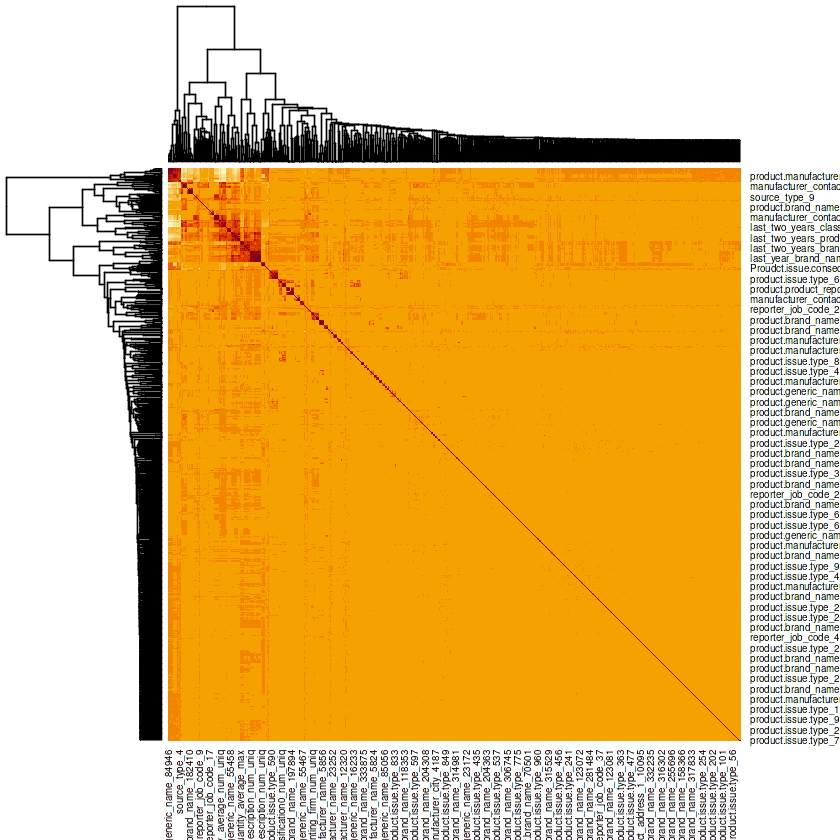

In [ ]:
# Calculate the correlation matrix
cor_matrix <- cor(df_normalized)

# Visualize the correlation matrix using a heatmap
heatmap(cor_matrix, symm = TRUE)

# Set the threshold for correlation coefficient
threshold <- 0.7

# Find pairs of highly correlated predictors
highly_correlated <- which(cor_matrix > threshold & cor_matrix < 1, arr.ind = TRUE)

In [ ]:
print(names(df_normalized))

NULL


droping highly correlated variables

In [ ]:
# Remove one predictor from each pair of highly correlated predictors
predictors_to_remove <- c()
for (i in 1:nrow(highly_correlated)) {
  row_index <- highly_correlated[i, 1]
  col_index <- highly_correlated[i, 2]
  if (!(row_index %in% predictors_to_remove)) {
    predictors_to_remove <- c(predictors_to_remove, row_index)
  }
}

# Remove highly correlated predictors from X
df_no_multicollinearity <- df_normalized[, -predictors_to_remove]

# Print the names of removed predictors
removed_predictors <- colnames(df_normalized)[predictors_to_remove]
print(paste("Removed predictors:", removed_predictors))


  [1] "Removed predictors: last_year_all_product_codes_most_freq"                   
  [2] "Removed predictors: last_year_brand_name_num_uniq"                           
  [3] "Removed predictors: last_year_brand_name_most_freq"                          
  [4] "Removed predictors: last_year_company_name_num_uniq"                         
  [5] "Removed predictors: last_year_company_name_most_freq"                        
  [6] "Removed predictors: last_year_reason_for_legal_announcement_num_uniq"        
  [7] "Removed predictors: last_year_reason_for_legal_announcement_most_freq"       
  [8] "Removed predictors: last_year_legal_announcementing_firm_num_uniq"           
  [9] "Removed predictors: last_year_legal_announcementing_firm_most_freq"          
 [10] "Removed predictors: last_year_root_cause_description_num_uniq"               
 [11] "Removed predictors: last_year_root_cause_description_most_freq"              
 [12] "Removed predictors: last_year_decision_date_max_changes_in

Making sure that there are no null values our final data frame

In [ ]:
null_counts <- colSums(is.na(df_no_multicollinearity))
num_cols_with_null <- sum(null_counts > 0)
print(paste("Number of columns with null values:", num_cols_with_null))

[1] "Number of columns with null values: 0"


In [ ]:
df_no_multicollinearity <- as.data.frame(df_no_multicollinearity)

In [ ]:
head(df_no_multicollinearity["Proudct.issue.consequence_Malfunction"])

,Proudct.issue.consequence_Malfunction
,<dbl>
1,0
2,0
3,0
4,1
5,0
6,1


Step.1: Selecting our first response variable for lasso regression

In [ ]:
install.packages("glmnet")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
library(glmnet)

filtered_data <- df_no_multicollinearity[, "Proudct.issue.consequence_Death", drop = FALSE]
X_iss_consq_Death <- df_no_multicollinearity[, !(names(df_no_multicollinearity) %in% "Proudct.issue.consequence_Death")]

Loading required package: Matrix

Loaded glmnet 4.1-8



In [ ]:
class(filtered_data)


[1] "data.frame"

In [ ]:
y_iss_consq_Death <- as.integer(filtered_data[, "Proudct.issue.consequence_Death"])


Step.2: Cross validation : Selcting the best lamda value for lasso regression

In [ ]:
```{r}
library(caret)

# Set up cross-validation
set.seed(123)  # for reproducibility
num_folds <- 3
folds <- createFolds(y, k = num_folds)

# Initialize parameters for grid search
lambda_values <- c(0.01, 0.05, 0.1, 0.5, 1)
best_lambda <- NULL
best_rmse <- Inf
learning_rate <- 0.05
# Perform grid search using cross-validation
for (lambda in lambda_values) {
  rmse <- numeric(num_folds)

  for (fold in 1:num_folds) {
    # Split data into training and validation sets
    train_indices <- unlist(folds[-fold])
    validation_indices <- unlist(folds[fold])

    X_train <- X_no_multicollinearity[train_indices, ]
    y_train <- y[train_indices]
    X_validation <- X_no_multicollinearity[validation_indices, ]
    y_validation <- y[validation_indices]

    # Initialize model parameters
    beta <- matrix(rnorm(ncol(X_train)), ncol = 1)
    num_iterations <- 50
    batch_size <- 100  # Adjust batch size to your system's capacity

    # SGD with Lasso regularization using mini-batches
    for (iter in 1:num_iterations) {
      # Sample random mini-batch
      batch_indices <- sample(nrow(X_train), batch_size)
      X_batch <- X_train[batch_indices, ]
      y_batch <- y_train[batch_indices]

      X_batch <- apply(X_batch, 2, as.numeric)
      beta <- as.matrix(as.numeric(beta))

      gradient <- t(X_batch) %*% (X_batch %*% beta - y_batch) / batch_size

      # Update model parameters using Lasso update rule
      beta <- beta - learning_rate * gradient

      # Apply Lasso regularization
      beta <- sign(beta) * pmax(abs(beta) - lambda * learning_rate, 0)
    }

    # Predict on validation set
    y_pred <- X_validation %*% beta

    # Calculate RMSE
    rmse[fold] <- sqrt(mean((y_pred - y_validation)^2))
  }

  # Average RMSE across folds
  avg_rmse <- mean(rmse)

  # Update best lambda and best RMSE if needed
  if (avg_rmse < best_rmse) {
    best_rmse <- avg_rmse
    best_lambda <- lambda
  }
}
```

In [ ]:
num_elements <- length(y_iss_consq_Death)
print(num_elements)

[1] 568088


In [ ]:
head(y_iss_consq_Death)

[1] 0 0 0 0 0 0

In [ ]:
head(X_iss_consq_Death)

,last_two_years_all_product_codes_num_uniq,last_two_years_classification1_num_uniq,last_four_years_all_product_codes_num_uniq,last_four_years_brand_name_most_freq,last_four_years_classification0_num_uniq,last_four_years_classification1_num_uniq,last_four_years_reason_for_legal_announcement_most_freq,last_four_years_legal_announcementing_firm_num_uniq,Proudct.issue.consequence_Injury,Proudct.issue.consequence_Malfunction,⋯,product.manufacturer_city_6259,product.manufacturer_city_7659,product.manufacturer_city_9053,product.manufacturer_city_9084,product.manufacturer_city_9636,product.manufacturer_city_9996,product.manufacturer_city_10000,product.manufacturer_city_10355,product.manufacturer_city_10778,product.manufacturer_country_84
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.125,0.03888889,0,0.03402226,0,0.03351955,0.3378661,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
2,0.125,0.03888889,0,0.03402226,0,0.03351955,0.3378661,0,0,0,⋯,0,0,0,1,0,0,0,0,0,0
3,0.125,0.03888889,0,0.03402226,0,0.03351955,0.3378661,0,0,0,⋯,0,0,0,1,0,0,0,0,0,0
4,0.125,0.03888889,0,0.03402226,0,0.03351955,0.3378661,0,0,1,⋯,0,0,0,0,0,0,0,0,0,0
5,0.125,0.03888889,0,0.03402226,0,0.03351955,0.3378661,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
6,0.125,0.03888889,0,0.03402226,0,0.03351955,0.3378661,0,0,1,⋯,0,0,0,0,0,0,0,0,0,0


Step.3:Due to limited computing resources it was cruscial to perform lasso in batches as done in the code below

In [ ]:
#lasso
learning_rate <- 0.01
batch_size <- 200
num_iterations <- num_elements/batch_size
lambda <- 0.05 # Regularization parameter

# Initialize model parameters
beta <- matrix(rnorm(ncol(X_iss_consq_Death)), ncol = 1) # Initialize coefficients randomly
print(dim(beta))

# SGD with Lasso regularization
for (iter in 1:num_iterations) {
  # Sample random batch
  indices <- sample(nrow(X_iss_consq_Death), batch_size)
  X_batch <- X_iss_consq_Death[indices, ]
  y_batch <- y_iss_consq_Death[indices]


  X_batch <- apply(X_batch, 2, as.numeric)
  beta <- as.numeric(beta)

  gradient <- t(X_batch) %*% (X_batch %*% beta - y_batch) / batch_size

  # Update model parameters using Lasso update rule
  beta <- beta - learning_rate * gradient

  # Apply Lasso regularization
  beta <- sign(beta) * pmax(abs(beta) - lambda * learning_rate, 0)
}

# Final model parameters
print(beta)

[1] 507   1
                                                                 [,1]
last_two_years_all_product_codes_num_uniq                0.0000000000
last_two_years_classification1_num_uniq                  0.0000000000
last_four_years_all_product_codes_num_uniq               0.0000000000
last_four_years_brand_name_most_freq                     0.0000000000
last_four_years_classification0_num_uniq                 0.0000000000
last_four_years_classification1_num_uniq                 0.0000000000
last_four_years_reason_for_legal_announcement_most_freq  0.0000000000
last_four_years_legal_announcementing_firm_num_uniq      0.0000000000
Proudct.issue.consequence_Injury                         0.0000000000
Proudct.issue.consequence_Malfunction                    0.0000000000
Proudct.issue.consequence_No answer provided             0.0000000000
manufacturer_contact_address_1_118                       0.0000000000
manufacturer_contact_address_1_1559                      0.0000000000
manufact

Step.4:selecting all the variable with non-zero beta value.

In [ ]:
beta_Death = beta
non_zero_indices <- which(beta != 0)
non_zero_beta <- beta[non_zero_indices]

# Create new DataFrame without features with zero coefficients
new_df_prod_issue_consq_Death <- df_no_multicollinearity[, non_zero_indices]
head(new_df_prod_issue_consq_Death)

,manufacturer_contact_address_1_1559,manufacturer_contact_address_1_7225,product.brand_name_14520,product.brand_name_43394,product.brand_name_81169,product.brand_name_81580,product.brand_name_92122,product.brand_name_122832,product.brand_name_123065,product.brand_name_146898,⋯,product.issue.type_956,product.issue.type_957,reporter_job_code_5,reporter_job_code_28,reporter_job_code_42,source_type_9,source_type_15,product.manufacturer_name_11508,product.manufacturer_city_6259,product.manufacturer_city_9053
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,1,0,0,0,0,0


Step.5:presenting top 10 variables with highest beta value.

In [ ]:
beta_values <- data.frame(column_name = colnames(X_iss_consq_Death), beta_value = beta_Death)

# Sort the data frame by absolute values of beta
sorted_beta_values <- beta_values[order(abs(beta_values$beta_value), decreasing = TRUE), ]

# Extract the top 10 rows
top_10_rows <- sorted_beta_values[1:10, ]

# Print the top 10 column names and their corresponding beta values
print(top_10_rows)

                                          column_name beta_value
product.generic_name_61630 product.generic_name_61630  1.6505944
product.generic_name_23175 product.generic_name_23175 -1.2666886
product.brand_name_316115   product.brand_name_316115  1.2088241
source_type_10                         source_type_10  1.1954942
product.issue.type_172         product.issue.type_172  1.1650895
product.brand_name_204321   product.brand_name_204321  1.0688022
product.brand_name_321514   product.brand_name_321514 -1.0199990
product.brand_name_204348   product.brand_name_204348 -0.9981236
product.generic_name_32408 product.generic_name_32408 -0.9916809
product.brand_name_204344   product.brand_name_204344  0.9743168


In [ ]:


head(df_beta_Death)

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'head': object 'df_beta_Death' not found


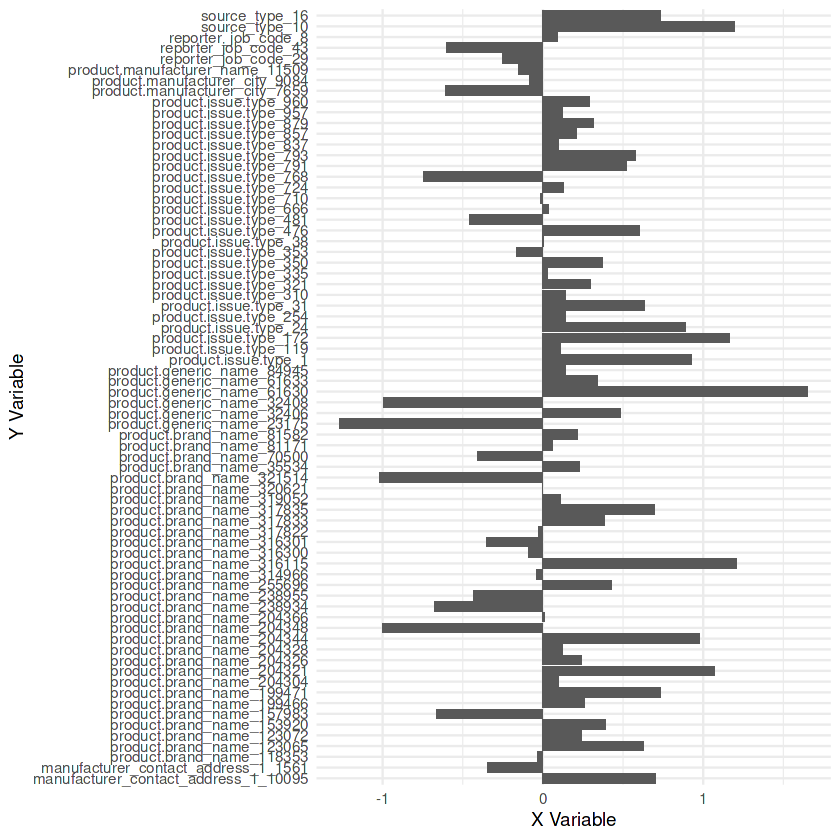

In [ ]:

library(ggplot2)

df_beta_Death <- data.frame(column_name = colnames(X_iss_consq_Death), beta_value = beta_Death)

# Filter out rows where x_var is non-zero
filtered_df <- df_beta_Death[df_beta_Death$beta_value != 0, ]

if (nrow(filtered_df) == 0) {
  stop("No data left after filtering.")
}

# Create histogram
ggplot(filtered_df, aes(x = beta_value, y = column_name)) +
  geom_bar(stat = "identity") +
  labs(x = "X Variable", y = "Y Variable") +
  theme_minimal()


Repeating all five steps performed above, for another response variable

In [ ]:
#chossing another variable
filtered_data <- df_no_multicollinearity[, "Proudct.issue.consequence_Injury", drop = FALSE]
X_iss_consq_Injury <- df_no_multicollinearity[, !(names(df_no_multicollinearity) %in% "Proudct.issue.consequence_Injury")]
y_iss_consq_Injury <- as.integer(filtered_data$Proudct.issue.consequence_Injury)

In [ ]:
#cross validation
```{r}
library(caret)

# Set up cross-validation
set.seed(123)  # for reproducibility
num_folds <- 3
folds <- createFolds(y, k = num_folds)

# Initialize parameters for grid search
lambda_values <- c(0.01, 0.05, 0.1, 0.5, 1)
best_lambda <- NULL
best_rmse <- Inf
learning_rate <- 0.05
# Perform grid search using cross-validation
for (lambda in lambda_values) {
  rmse <- numeric(num_folds)

  for (fold in 1:num_folds) {
    # Split data into training and validation sets
    train_indices <- unlist(folds[-fold])
    validation_indices <- unlist(folds[fold])

    X_train <- X_no_multicollinearity[train_indices, ]
    y_train <- y[train_indices]
    X_validation <- X_no_multicollinearity[validation_indices, ]
    y_validation <- y[validation_indices]

    # Initialize model parameters
    beta <- matrix(rnorm(ncol(X_train)), ncol = 1)
    num_iterations <- 50
    batch_size <- 100  # Adjust batch size to your system's capacity

    # SGD with Lasso regularization using mini-batches
    for (iter in 1:num_iterations) {
      # Sample random mini-batch
      batch_indices <- sample(nrow(X_train), batch_size)
      X_batch <- X_train[batch_indices, ]
      y_batch <- y_train[batch_indices]

      X_batch <- apply(X_batch, 2, as.numeric)
      beta <- as.matrix(as.numeric(beta))

      gradient <- t(X_batch) %*% (X_batch %*% beta - y_batch) / batch_size

      # Update model parameters using Lasso update rule
      beta <- beta - learning_rate * gradient

      # Apply Lasso regularization
      beta <- sign(beta) * pmax(abs(beta) - lambda * learning_rate, 0)
    }

    # Predict on validation set
    y_pred <- X_validation %*% beta

    # Calculate RMSE
    rmse[fold] <- sqrt(mean((y_pred - y_validation)^2))
  }

  # Average RMSE across folds
  avg_rmse <- mean(rmse)

  # Update best lambda and best RMSE if needed
  if (avg_rmse < best_rmse) {
    best_rmse <- avg_rmse
    best_lambda <- lambda
  }
}
```




In [ ]:
#lasso
learning_rate <- 0.01
batch_size <- 200
num_iterations <- num_elements/batch_size
lambda <- 0.05 # Regularization parameter

# Initialize model parameters
beta <- matrix(rnorm(ncol(X_iss_consq_Injury)), ncol = 1) # Initialize coefficients randomly
print(dim(beta))

# SGD with Lasso regularization
for (iter in 1:num_iterations) {
  # Sample random batch
  indices <- sample(nrow(X_iss_consq_Injury), batch_size)
  X_batch <- X_iss_consq_Injury[indices, ]
  y_batch <- y_iss_consq_Injury[indices]


  X_batch <- apply(X_batch, 2, as.numeric)
  beta <- as.matrix(as.numeric(beta))

  gradient <- t(X_batch) %*% (X_batch %*% beta - y_batch) / batch_size

  # Update model parameters using Lasso update rule
  beta <- beta - learning_rate * gradient

  # Apply Lasso regularization
  beta <- sign(beta) * pmax(abs(beta) - lambda * learning_rate, 0)
}

# Final model parameters
print(beta)

[1] 507   1
                                                                 [,1]
last_two_years_all_product_codes_num_uniq                0.0002138872
last_two_years_classification1_num_uniq                  0.0000000000
last_four_years_all_product_codes_num_uniq               0.1015771994
last_four_years_brand_name_most_freq                     0.2964655785
last_four_years_classification0_num_uniq                 0.0000000000
last_four_years_classification1_num_uniq                 0.0000000000
last_four_years_reason_for_legal_announcement_most_freq  0.0671207134
last_four_years_legal_announcementing_firm_num_uniq      0.0000000000
Proudct.issue.consequence_Death                          0.0000000000
Proudct.issue.consequence_Malfunction                   -0.5127691286
Proudct.issue.consequence_No answer provided             0.0000000000
manufacturer_contact_address_1_118                      -0.1158283502
manufacturer_contact_address_1_1559                     -0.4248441046
manufact

In [ ]:
beta_injury = beta
non_zero_indices <- which(beta != 0)
non_zero_beta <- beta[non_zero_indices]

# Create new DataFrame without features with zero coefficients
new_df_prod_issue_consq_Injury <- df_no_multicollinearity[, non_zero_indices]
head(new_df_prod_issue_consq_Injury)

,last_two_years_all_product_codes_num_uniq,last_four_years_all_product_codes_num_uniq,last_four_years_brand_name_most_freq,last_four_years_reason_for_legal_announcement_most_freq,Proudct.issue.consequence_Injury,Proudct.issue.consequence_No answer provided,manufacturer_contact_address_1_118,product.brand_name_43394,product.brand_name_81169,product.brand_name_81174,⋯,reporter_job_code_29,reporter_job_code_36,source_type_6,source_type_9,source_type_10,source_type_17,product.manufacturer_name_18383,product.manufacturer_name_19164,product.manufacturer_city_5020,product.manufacturer_city_5432
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.125,0,0.03402226,0.3378661,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
2,0.125,0,0.03402226,0.3378661,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
3,0.125,0,0.03402226,0.3378661,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
4,0.125,0,0.03402226,0.3378661,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
5,0.125,0,0.03402226,0.3378661,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
6,0.125,0,0.03402226,0.3378661,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


In [ ]:
beta_values <- data.frame(column_name = colnames(X_iss_consq_Injury), beta_value = beta_injury)

# Sort the data frame by absolute values of beta
sorted_beta_values <- beta_values[order(abs(beta_values$beta_value), decreasing = TRUE), ]

# Extract the top 10 rows
top_10_rows <- sorted_beta_values[1:10, ]

# Print the top 10 column names and their corresponding beta values
print(top_10_rows)

                                                    column_name beta_value
product.brand_name_238935             product.brand_name_238935 -2.4240646
product.issue.type_353                   product.issue.type_353 -1.3571893
product.brand_name_314966             product.brand_name_314966  1.0619752
product.brand_name_204328             product.brand_name_204328 -1.0163951
product.issue.type_60                     product.issue.type_60 -1.0068630
product.issue.type_61                     product.issue.type_61 -0.9937039
product.manufacturer_name_19243 product.manufacturer_name_19243 -0.9493240
product.issue.type_24                     product.issue.type_24  0.8300109
product.issue.type_964                   product.issue.type_964  0.8021788
product.issue.type_551                   product.issue.type_551  0.7973216


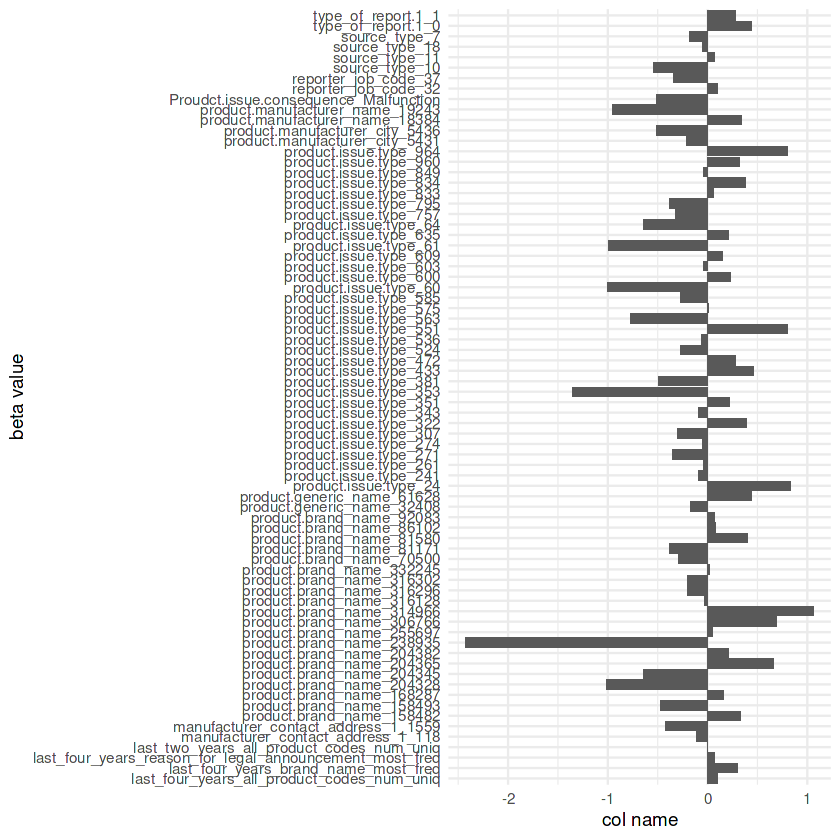

In [ ]:
df_beta_injury <- data.frame(column_name = colnames(X_iss_consq_Death), beta_value = beta_injury)


# Assuming your data frame is named 'df' and the x and y variables are 'x_var' and 'y_var' respectively
# Filter out rows where x_var is non-zero
filtered_df <- df_beta_injury[df_beta_injury$beta_value != 0, ]

if (nrow(filtered_df) == 0) {
  stop("No data left after filtering.")
}

# Create histogram
ggplot(filtered_df, aes(x = beta_value, y = column_name)) +
  geom_bar(stat = "identity") +
  labs(x = "col name", y = "beta value") +
  theme_minimal()

Repeating all five steps performed above, for the third response variable

In [ ]:
#choosing 3rd variable for lasso
filtered_data <- df_no_multicollinearity[, "Proudct.issue.consequence_Malfunction", drop = FALSE]
X_iss_consq_Malf <- df_no_multicollinearity[, !(names(df_no_multicollinearity) %in% "Proudct.issue.consequence_Malfunction")]
y_iss_consq_Malf <- as.integer(filtered_data$Proudct.issue.consequence_Malfunction)

In [ ]:
#Cross Validation
```{r}
library(caret)

# Set up cross-validation
set.seed(123)  # for reproducibility
num_folds <- 3
folds <- createFolds(y, k = num_folds)

# Initialize parameters for grid search
lambda_values <- c(0.01, 0.05, 0.1, 0.5, 1)
best_lambda <- NULL
best_rmse <- Inf
learning_rate <- 0.05
# Perform grid search using cross-validation
for (lambda in lambda_values) {
  rmse <- numeric(num_folds)

  for (fold in 1:num_folds) {
    # Split data into training and validation sets
    train_indices <- unlist(folds[-fold])
    validation_indices <- unlist(folds[fold])

    X_train <- X_no_multicollinearity[train_indices, ]
    y_train <- y[train_indices]
    X_validation <- X_no_multicollinearity[validation_indices, ]
    y_validation <- y[validation_indices]

    # Initialize model parameters
    beta <- matrix(rnorm(ncol(X_train)), ncol = 1)
    num_iterations <- 50
    batch_size <- 100  # Adjust batch size to your system's capacity

    # SGD with Lasso regularization using mini-batches
    for (iter in 1:num_iterations) {
      # Sample random mini-batch
      batch_indices <- sample(nrow(X_train), batch_size)
      X_batch <- X_train[batch_indices, ]
      y_batch <- y_train[batch_indices]

      X_batch <- apply(X_batch, 2, as.numeric)
      beta <- as.matrix(as.numeric(beta))

      gradient <- t(X_batch) %*% (X_batch %*% beta - y_batch) / batch_size

      # Update model parameters using Lasso update rule
      beta <- beta - learning_rate * gradient

      # Apply Lasso regularization
      beta <- sign(beta) * pmax(abs(beta) - lambda * learning_rate, 0)
    }

    # Predict on validation set
    y_pred <- X_validation %*% beta

    # Calculate RMSE
    rmse[fold] <- sqrt(mean((y_pred - y_validation)^2))
  }

  # Average RMSE across folds
  avg_rmse <- mean(rmse)

  # Update best lambda and best RMSE if needed
  if (avg_rmse < best_rmse) {
    best_rmse <- avg_rmse
    best_lambda <- lambda
  }
}
```

In [ ]:
#lasso
learning_rate <- 0.01
batch_size <- 200
num_iterations <- num_elements/batch_size
lambda <- 0.05 # Regularization parameter

# Initialize model parameters
beta <- matrix(rnorm(ncol(X_iss_consq_Malf)), ncol = 1) # Initialize coefficients randomly
print(dim(beta))

# SGD with Lasso regularization
for (iter in 1:num_iterations) {
  # Sample random batch
  indices <- sample(nrow(X_iss_consq_Malf), batch_size)
  X_batch <- X_iss_consq_Malf[indices, ]
  y_batch <- y_iss_consq_Malf[indices]


  X_batch <- apply(X_batch, 2, as.numeric)
  beta <- as.matrix(as.numeric(beta))

  gradient <- t(X_batch) %*% (X_batch %*% beta - y_batch) / batch_size

  # Update model parameters using Lasso update rule
  beta <- beta - learning_rate * gradient

  # Apply Lasso regularization
  beta <- sign(beta) * pmax(abs(beta) - lambda * learning_rate, 0)
}

# Final model parameters
print(beta)

[1] 507   1
                                                                [,1]
last_two_years_all_product_codes_num_uniq                0.000000000
last_two_years_classification1_num_uniq                  0.000000000
last_four_years_all_product_codes_num_uniq               0.064740385
last_four_years_brand_name_most_freq                     0.149979882
last_four_years_classification0_num_uniq                 0.000000000
last_four_years_classification1_num_uniq                 0.000000000
last_four_years_reason_for_legal_announcement_most_freq  0.042658066
last_four_years_legal_announcementing_firm_num_uniq      0.000000000
Proudct.issue.consequence_Death                          0.000000000
Proudct.issue.consequence_Injury                        -0.419777309
Proudct.issue.consequence_No answer provided             0.351176399
manufacturer_contact_address_1_118                       0.000000000
manufacturer_contact_address_1_1559                      0.000000000
manufacturer_contact_a

In [ ]:
beta_malf = beta
non_zero_indices <- which(beta != 0)
non_zero_beta <- beta[non_zero_indices]

# Create new DataFrame without features with zero coefficients
new_df_prod_issue_consq_Malf <- df_no_multicollinearity[, non_zero_indices]
head(new_df_prod_issue_consq_Malf)

,last_four_years_all_product_codes_num_uniq,last_four_years_brand_name_most_freq,last_four_years_reason_for_legal_announcement_most_freq,Proudct.issue.consequence_Injury,Proudct.issue.consequence_Malfunction,manufacturer_contact_address_1_10095,manufacturer_contact_address_1_12855,product.brand_name_81174,product.brand_name_84421,product.brand_name_123065,⋯,reporter_job_code_50,source_type_3,source_type_10,product.manufacturer_name_18384,product.manufacturer_name_19574,product.manufacturer_city_5440,product.manufacturer_city_5998,product.manufacturer_city_6259,product.manufacturer_city_7659,product.manufacturer_city_10778
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0,0.03402226,0.3378661,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
2,0,0.03402226,0.3378661,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
3,0,0.03402226,0.3378661,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
4,0,0.03402226,0.3378661,0,1,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
5,0,0.03402226,0.3378661,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
6,0,0.03402226,0.3378661,0,1,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


In [ ]:
beta_values <- data.frame(column_name = colnames(X_iss_consq_Malf), beta_value = beta_malf)

# Sort the data frame by absolute values of beta
sorted_beta_values <- beta_values[order(abs(beta_values$beta_value), decreasing = TRUE), ]

# Extract the top 10 rows
top_10_rows <- sorted_beta_values[1:10, ]

# Print the top 10 column names and their corresponding beta values
print(top_10_rows)

                                          column_name beta_value
product.issue.type_391         product.issue.type_391 -2.0718776
product.issue.type_18           product.issue.type_18 -1.3262180
product.issue.type_603         product.issue.type_603 -1.2365321
product.brand_name_332253   product.brand_name_332253  1.2105493
product.brand_name_219511   product.brand_name_219511 -1.2049637
product.brand_name_278846   product.brand_name_278846  1.0344811
product.issue.type_274         product.issue.type_274  1.0179833
product.issue.type_224         product.issue.type_224  0.9932780
product.issue.type_564         product.issue.type_564  0.8973392
product.generic_name_16233 product.generic_name_16233 -0.8161244


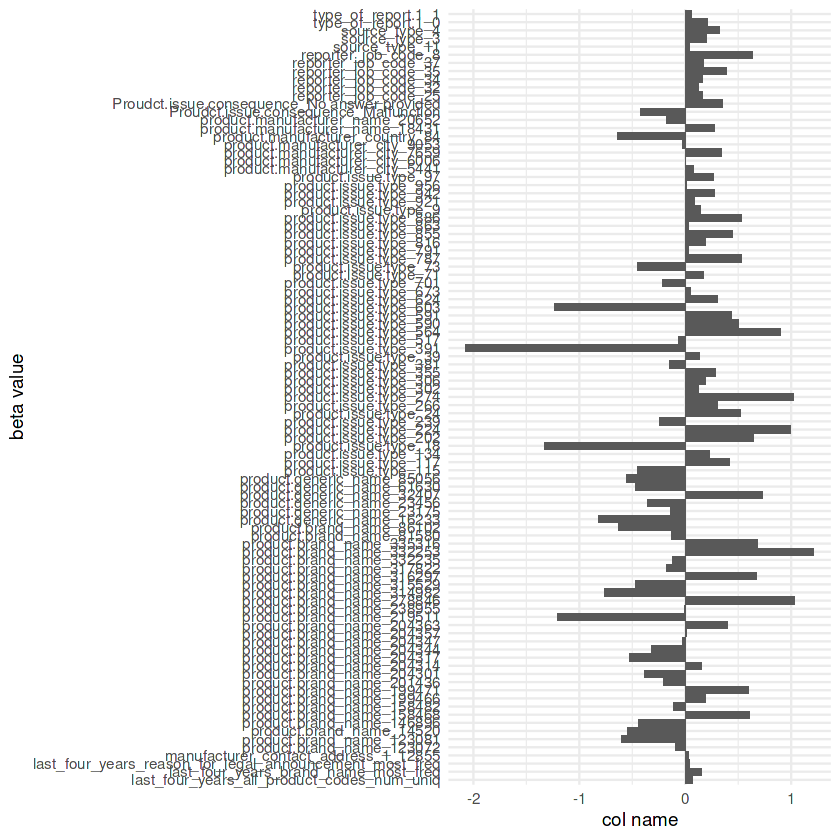

In [ ]:
df_beta_malf <- data.frame(column_name = colnames(X_iss_consq_Death), beta_value = beta_malf)


# Assuming your data frame is named 'df' and the x and y variables are 'x_var' and 'y_var' respectively
# Filter out rows where x_var is non-zero
filtered_df <- df_beta_malf[df_beta_malf$beta_value != 0, ]

if (nrow(filtered_df) == 0) {
  stop("No data left after filtering.")
}

# Create histogram
ggplot(filtered_df, aes(x = beta_value, y = column_name)) +
  geom_bar(stat = "identity") +
  labs(x = "col name", y = "beta value") +
  theme_minimal()

Performing test strain split over the data.

This step is crucial to ensure there is no over fitting

Selected product issue consequence and it's predictor as it had higher lasso values compared to other two repsonse variables

In [ ]:
# Set seed for reproducibility
Y <- df_no_multicollinearity$Proudct.issue.consequence_Injury

# Set the seed for reproducibility
set.seed(123)

# Define the proportion of data to be allocated to the training set
train_prop <- 0.8  # 80% of the data will be used for training

# Generate a vector of indices for the training set
train_indices <- sample(seq_len(nrow(df_no_multicollinearity)), size = round(train_prop * nrow(df_no_multicollinearity)))


# Create the training set for both data frame and response variable
train_data <- df_no_multicollinearity[train_indices, ]
train_Y <- Y[train_indices]

# Create the testing set for both data frame and response variable
test_data <- df_no_multicollinearity[-train_indices, ]
test_Y <- Y[-train_indices]

Applying the logistic regression model in batches considering the limited computational resources.


In [ ]:
# Install necessary packages
install.packages("keras")

# Load libraries
library(keras)

# Assuming train_data and train_Y are your training data and labels

# Convert data to matrix format
X_train <- as.matrix(train_data)
Y_train <- as.matrix(train_Y)


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
# Define a simple logistic regression model using Keras
model <- keras_model_sequential() %>%
  layer_dense(units = 1, activation = 'sigmoid', input_shape = dim(train_data)[2])

# Compile the model
model %>% compile(
  loss = 'binary_crossentropy',
  optimizer = optimizer_adam(),
  metrics = c('accuracy')
)

# Train the model
history <- model %>% fit(
  X_train, Y_train,
  epochs = 10,
  batch_size = 32,  # Adjust batch size as needed
  validation_split = 0.2  # Optionally specify a validation split
)

# Summary of the model
summary(model)


Model: "sequential"
________________________________________________________________________________
 Layer (type)                       Output Shape                    Param #     
 dense (Dense)                      (None, 1)                       509         
Total params: 509
Trainable params: 509
Non-trainable params: 0
________________________________________________________________________________


Was trying to apply the code below for logit due to limited computational capacity it was taking to long so used the above code as it was dividing data set into subsets


```{r}
library(stats)


  # Replace "Response_Variable" with the actual name of your response variable

# Apply logistic regression
logit_model <- glm(train_Y ~ ., data = train_data, family = binomial)

# Summarize the logistic regression model
summary(logit_model)
```

Model performance matrix

as seen below the model trained on training data is performing very well on the test data.

In [ ]:
X_test <- as.matrix(test_data)
Y_test <- as.matrix(test_Y)

# Evaluate the model on the training data
metrics <- model %>% evaluate(X_test, Y_test)


# Extract accuracy from the metrics
accuracy <- metrics[[2]]
cat("Accuracy:", accuracy)

Accuracy: 1

In [ ]:
X_train <- as.matrix(train_data)
Y_train <- as.matrix(train_Y)

# Predictions on test set
predictions <- model %>% predict(X_test) %>% `>`(0.5) %>% k_cast("int32")


# Confusion matrix
predictions <- as.integer(predictions)
Y_test <- as.integer(Y_test)
conf_matrix <- table(factor(predictions), factor(Y_test))

# Print confusion matrix
print(conf_matrix)

   
        0     1
  0 54077     0
  1     0 59541
